In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, DBSCAN, Birch, MeanShift, AffinityPropagation
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from sklearn import metrics

### **Part 1 : Data Analysis**

#### **Overview**

In [2]:
data = pd.read_csv('E:/Downloads/customer_data.csv')
data

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

First column which names *CUST_ID*, that stands for customer ID, does not reflect any useful information about the data.

In [4]:
data.drop('CUST_ID', axis = 1, inplace = True)

Now all features are of numerical types.

In [5]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


--- Based on the values of percentiles of each feature on the table above, it seems that values of the features *CASH_ADVANCE_TRX*, *PURCHASES_TRX*, and *TENURE* might not be continuous, but they should be checked for proving this hypothesis.

--- Regarding the count of each feature, there are some missing values in *CREDIT_LIMIT* and *MINIMUM_PAYMENTS* columns.

--- Considering percentiles, distributions of some of the features are heavily skwed, and they need further analysis. These features are *ONEOFF_PURCHASES*, *INSTALLMENTS_PURCHASES*, *CASH_ADVANCE*, *CASH_ADVANCE_TRX*, and *PURCHASES_TRX*.

--- All in all, visualizing and analysing plots might help with understanding the data more deeply.

#### **Early Visualizing**

In [6]:
plt.style.use('seaborn')

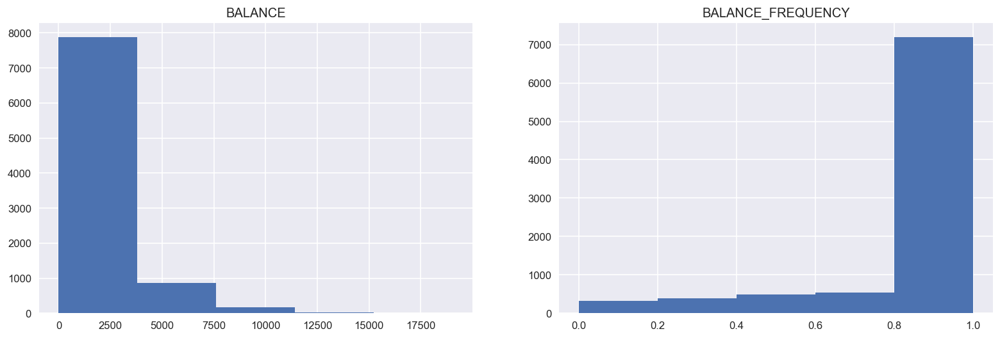

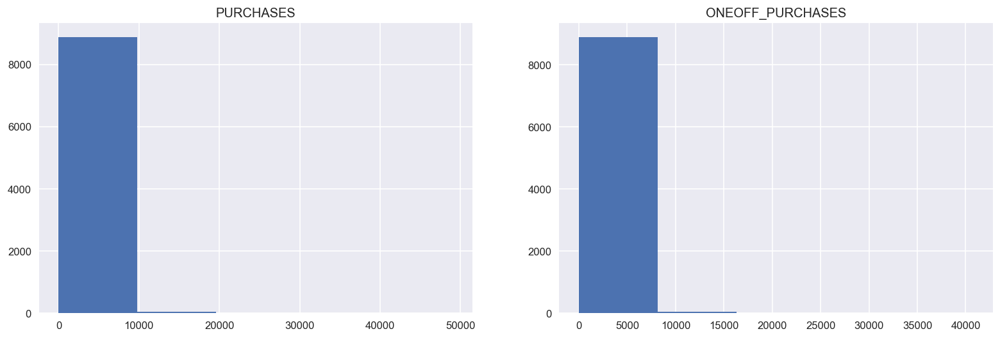

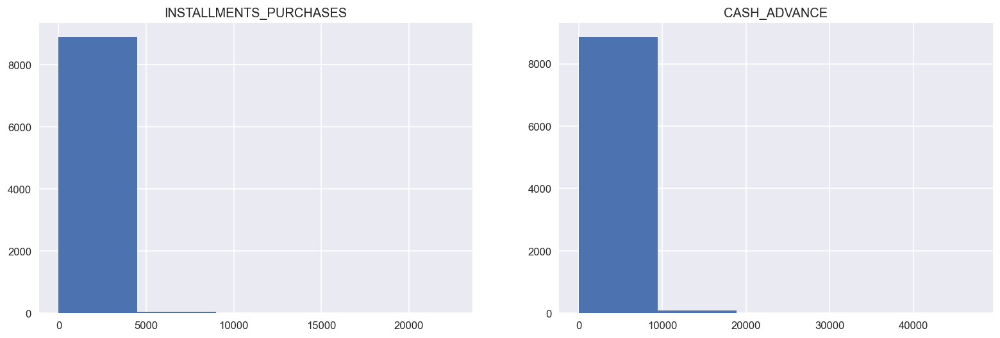

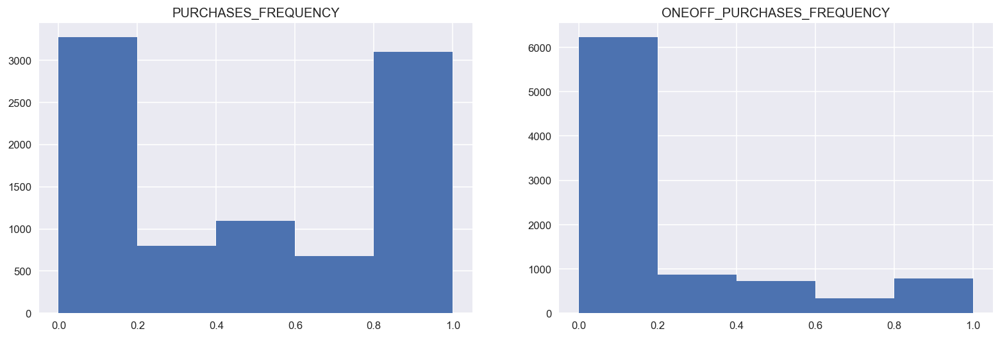

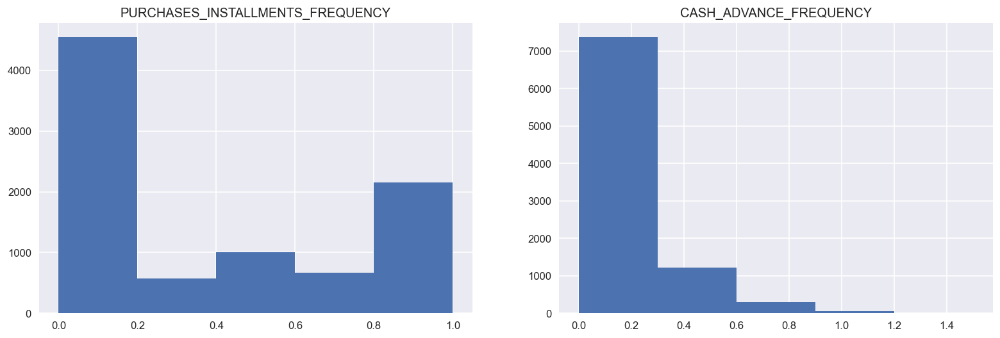

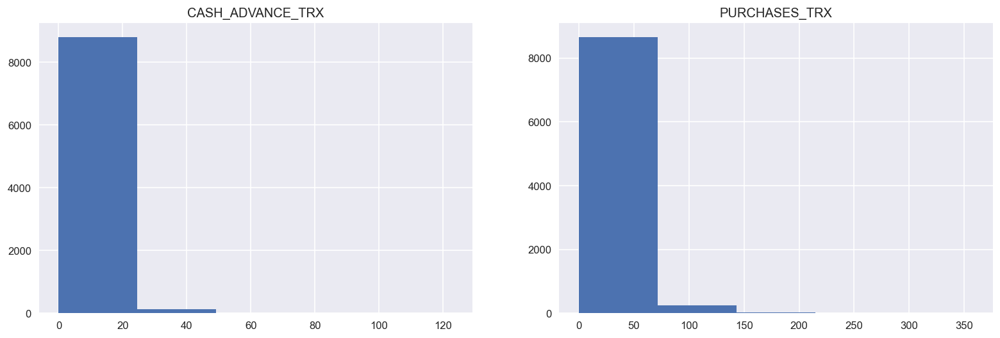

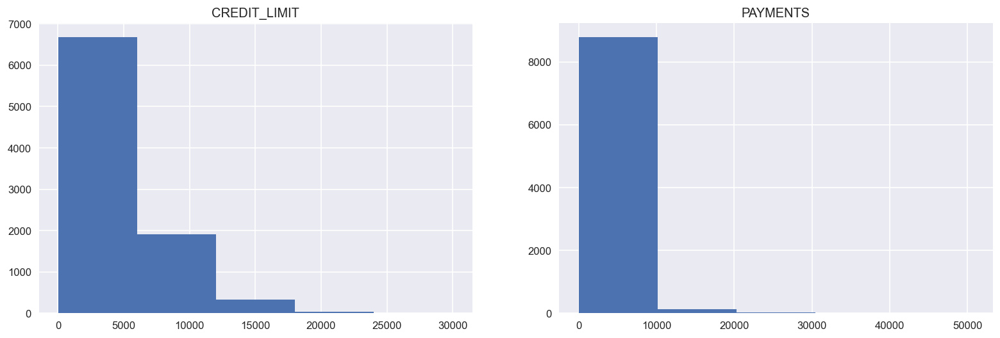

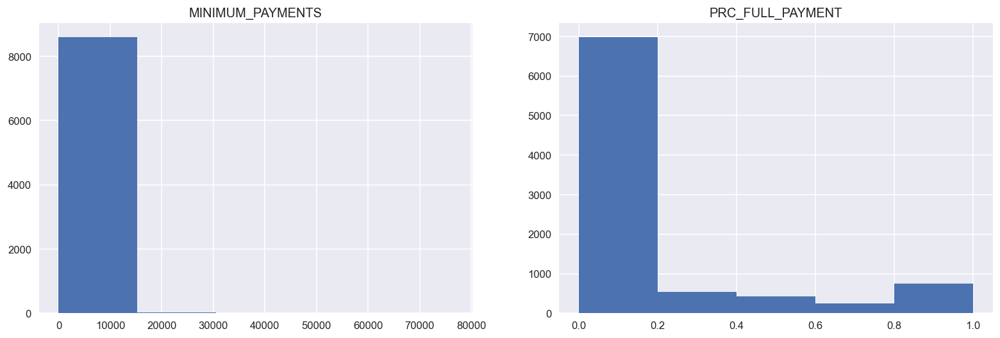

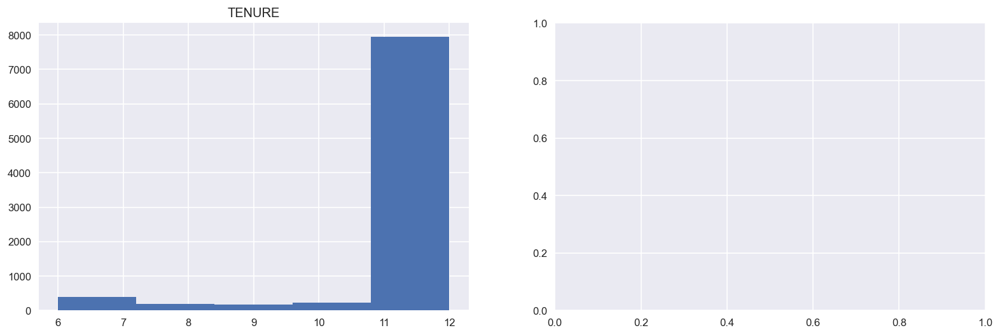

In [7]:
i = 0
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (16, 5), dpi = 120)
        plt.subplot(1,2,1)
        plt.hist(data[data.columns[i]], bins = 5)
        plt.title(data.columns[i])
        i += 1
        plt.subplot(1,2,2)
        plt.hist(data[data.columns[i]], bins = 5)
        plt.title(data.columns[i])
        i += 1
    except:
        continue
plt.show()

--- Except *PURCHASES_FREQUENCY*, none of the features benefit from balanced distribution. Also, even  *PURCHASES_FREQUENCY* does not have normal distribution!

--- As it was mentioned in the previous part, some features are heavily skwed. As a result, further inspection for finding outliers is a must. Also, usual clustering algorithms might not be efficient enough.

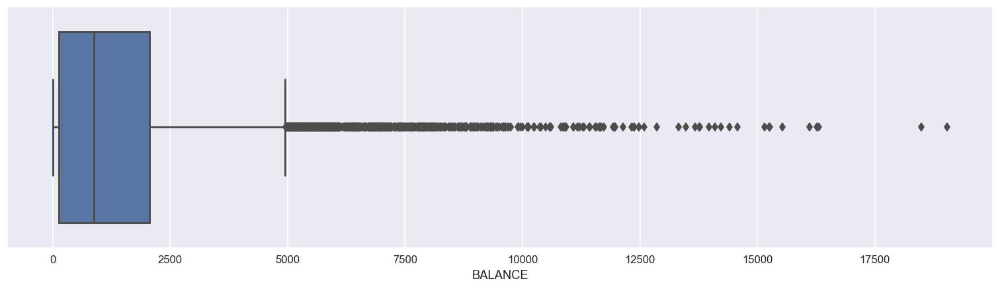

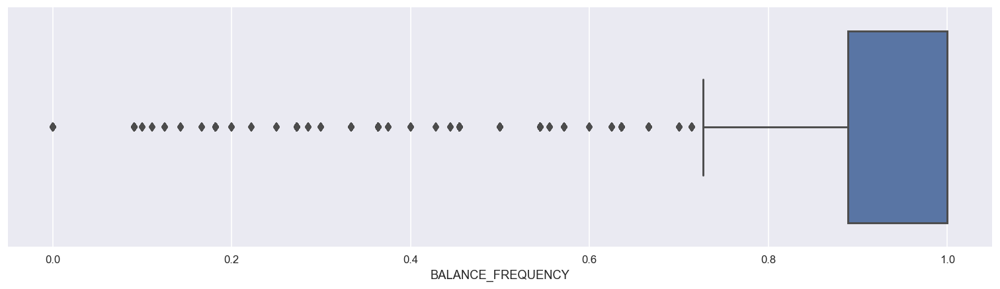

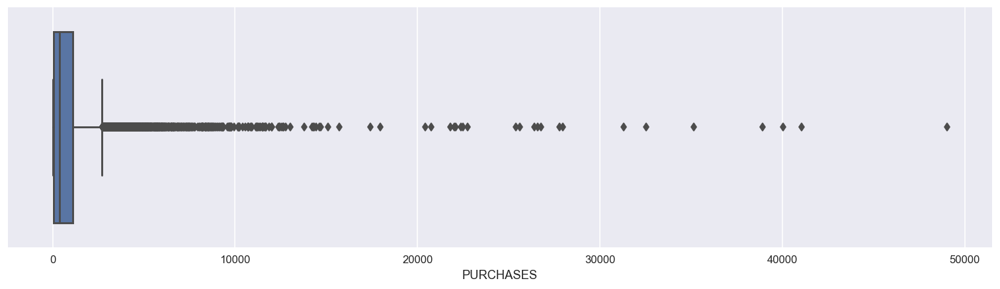

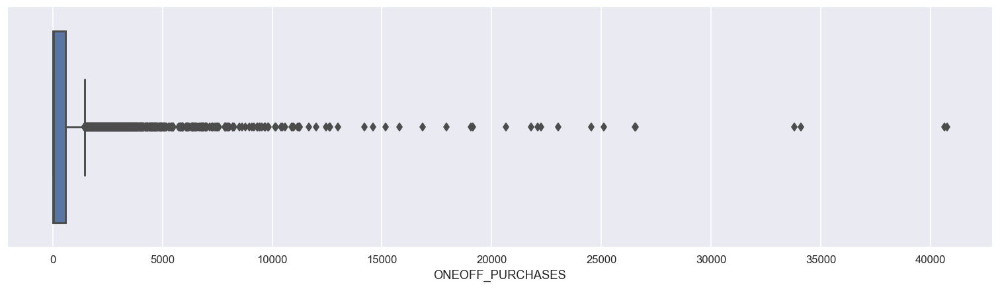

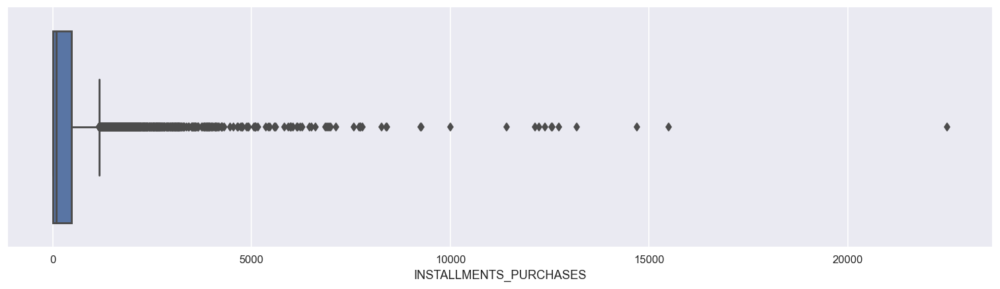

...

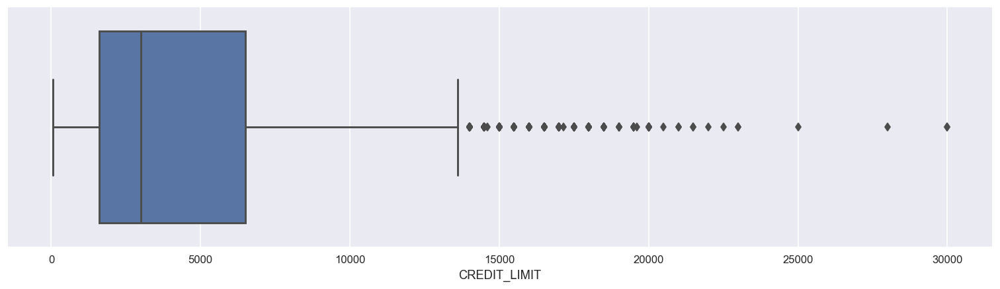

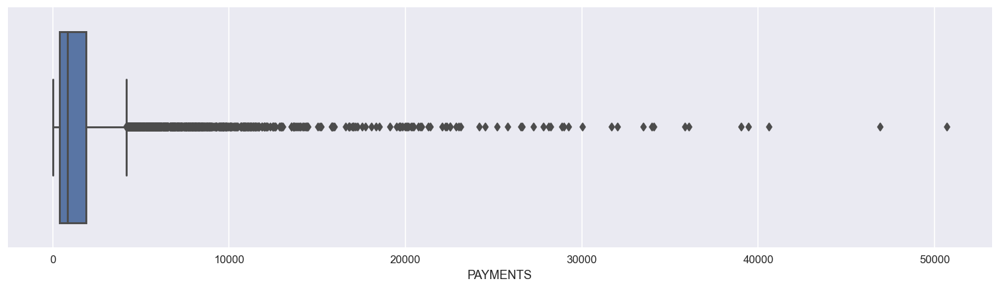

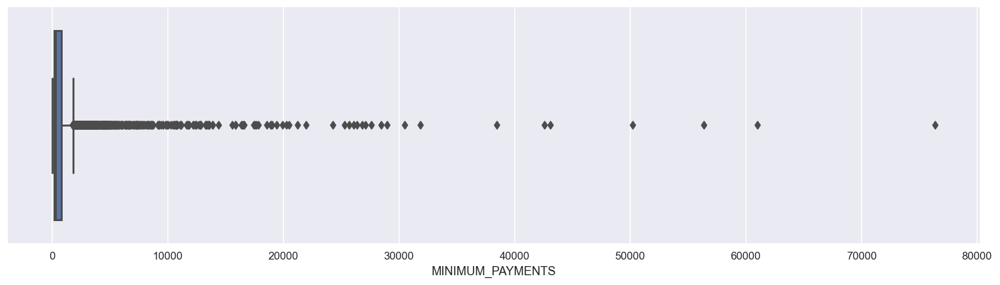

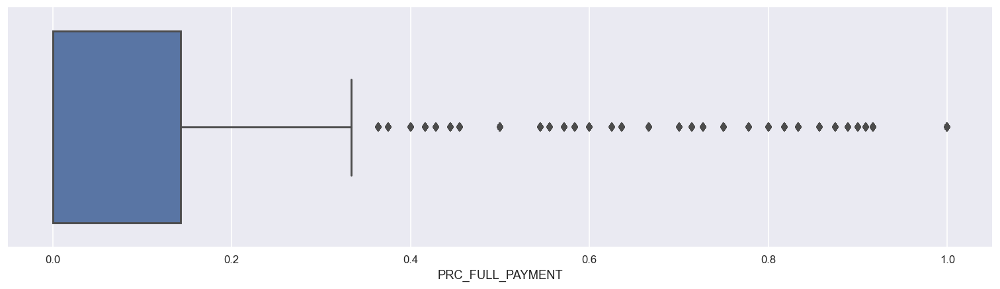

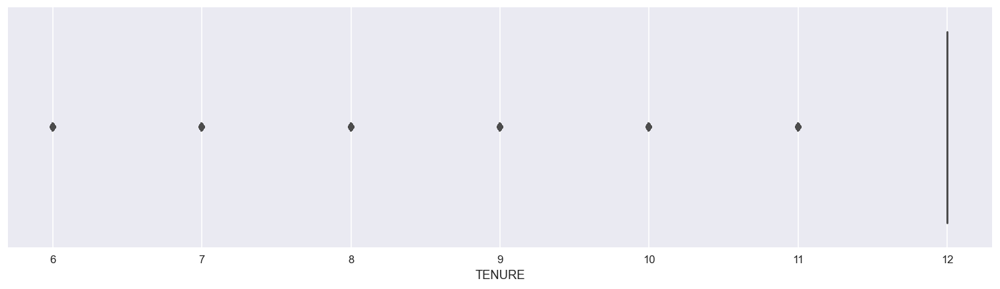

In [8]:
i = 0
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (16, 4), dpi = 120)
        sns.boxplot(x = data.columns[i], data = data)
        i += 1
    except:
        continue
plt.show()

* **Box Plots Interpretations**

--- **BALANCE** : There might be some noises as there are outliers which have values more than 17500.

--- **BALANCE_FREQUENCY** : There are some values equal to zero, however the distance is not significant.

--- **PURCHASES** : Values more than 30000 are outliers, but there is one near 50000 that is suspicious to be a noise.

--- **ONEOFF_PURCHASES** : There are some outliers more than 33000.

--- **INSTALLMENT_PURCHASES** : A sample with a value more than 20000 might be a noise.

--- **CASH_ADVANCE** : A value that is more than 40000 is an outlier and should be inspected.

--- **PURCHASES_FREQUENCY** : Values in this column are distributed with balance, and no outlier is on the plot.

--- **ONEOFF_PURCHASES_FREQUENCY** : None of the values is as far from the rest as a noise might be.

--- **PURCHASES_INSTALLMENT_FREQUENCY** : Also in this column there is a balance in distribution of the samples, and there is not any outlier.

--- **CASH_ADVANCE_FREQUENCY** : However the value more than 14 seems like an outlier, but there is a low chance of being a noise.

--- **CASH_ADVANCE_TRX** : Most of the values in this column are near "0". So, it should be inspected in relation with other features.

--- **PURCHASES_TRX** : Just like *CASH_ADVANCE_TRX*, an analysis in relation with other features is needed.

--- **CREDIT_LIMIT** : Samples equal or above 25000 should be inspected.

--- **PAYMENTS** : There are number of outliers with values above 45000.

--- **MINIMUM_PAYMENTS** : Values more than 35000 should be reviewed carefully.

--- **PRC_FULL_PAYMENT** : There is not any outlier or noise.

--- **TENURE** : Values on this column are not continuous.

In [9]:
data.sample(20)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5638,1394.245166,1.000000,684.85,61.85,623.00,1574.545965,0.583333,0.083333,0.416667,0.416667,9,7,1500.0,2411.283485,1291.785690,0.090909,12
1563,4676.575915,1.000000,453.64,0.00,453.64,1984.010422,0.333333,0.000000,0.333333,0.166667,5,4,8000.0,1274.301021,2539.523493,0.000000,12
5273,1500.810722,1.000000,2340.87,1975.55,365.32,0.000000,0.916667,0.833333,0.500000,0.000000,0,31,5500.0,348.740817,431.266392,0.000000,12
7632,25.407311,1.000000,504.96,0.00,504.96,0.000000,1.000000,0.000000,1.000000,0.000000,0,48,3000.0,464.099225,166.397650,0.916667,12
7083,11.441738,0.363636,93.60,0.00,93.60,0.000000,0.250000,0.000000,0.250000,0.000000,0,3,1900.0,603.723258,130.224347,0.250000,12
1548,843.357393,1.000000,45.00,45.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,2000.0,304.408605,312.893487,0.000000,12
4536,300.427627,1.000000,443.71,0.00,443.71,0.000000,0.916667,0.000000,0.916667,0.000000,0,11,1000.0,372.548129,228.365901,0.000000,12
4152,697.141393,1.000000,1027.28,567.00,460.28,0.000000,0.583333,0.083333,0.416667,0.000000,0,13,2000.0,1822.954828,175.169946,0.000000,12
8345,5.902257,0.818182,246.25,0.00,246.25,0.000000,0.500000,0.000000,0.500000,0.000000,0,9,1000.0,316.597475,85.012713,0.777778,12
8309,6008.914524,0.777778,0.00,0.00,0.00,8304.470149,0.000000,0.000000,0.000000,0.333333,9,0,9000.0,1279.301117,1404.889491,0.000000,9


--- There are four columns with discrete values, for better insight their countplot is being analysed.

--- Colummns : CASH_ADVANCE_TRX, PURCHASES_TRX, CREDIT_LIMIT, TENURE

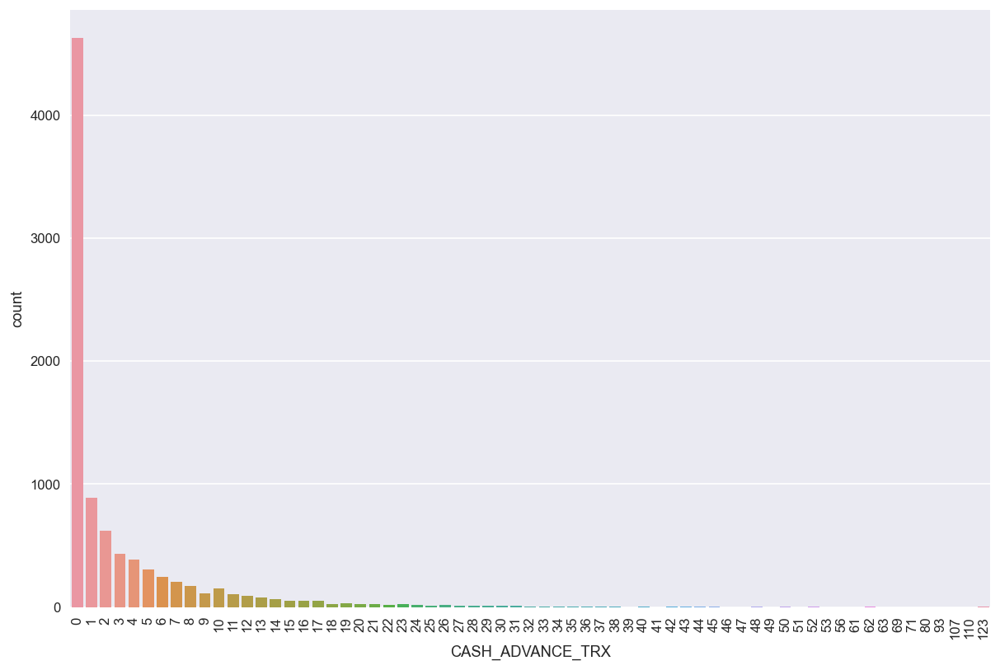

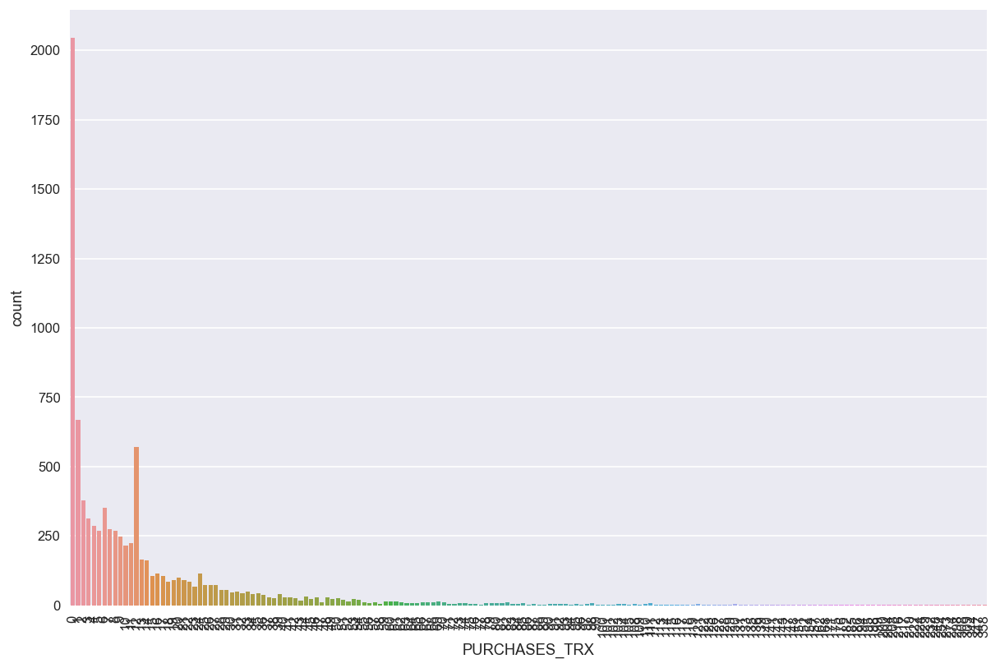

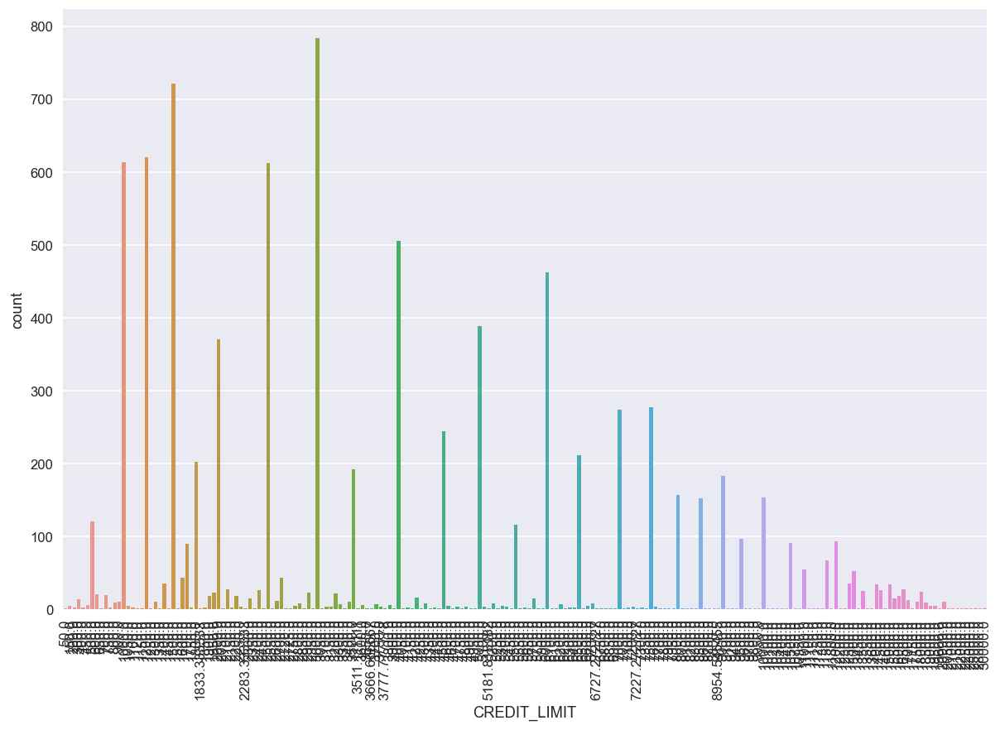

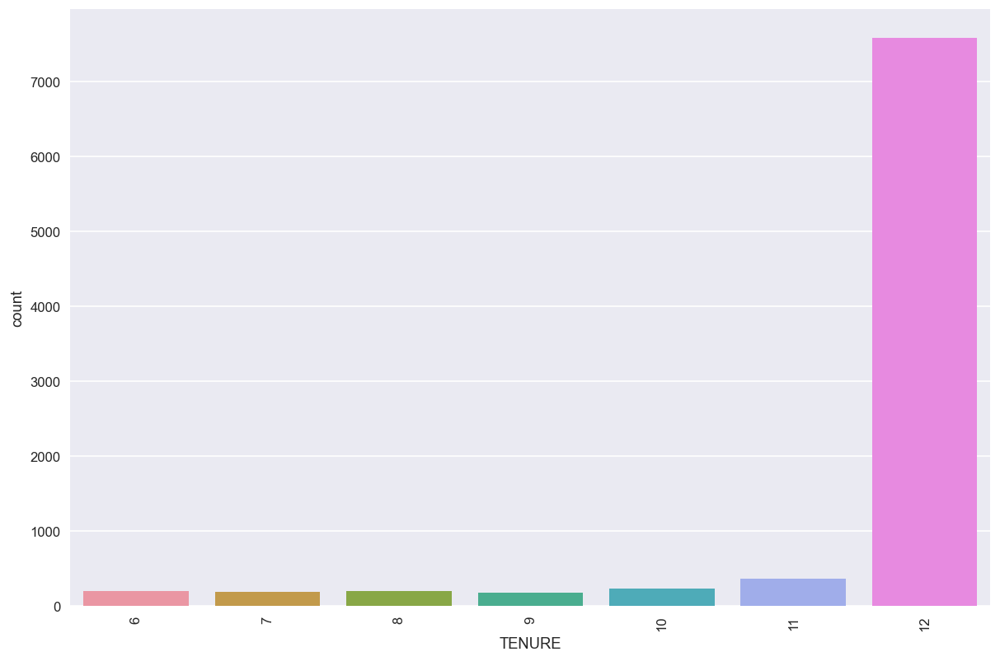

In [10]:
disc_features = ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'TENURE']
for i in range(4):
    fig = plt.figure(figsize = (12, 8), dpi = 120)
    sns.countplot(x = disc_features[i], data = data)
    plt.xticks(rotation = 90)
    i += 1

--- Distribution of the values in the *CREDIT_LIMIT* column is almost gaussain.

--- Considring that *TENURE* is the amount of time to repay a loan, it seems that the values in this column reflect the number of months.

#### **Handling Missing Values**

In [11]:
data.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [12]:
data[['CREDIT_LIMIT', 'MINIMUM_PAYMENTS']].describe()

,CREDIT_LIMIT,MINIMUM_PAYMENTS
count,8949.000000,8637.000000
mean,4494.449450,864.206542
std,3638.815725,2372.446607
min,50.000000,0.019163
25%,1600.000000,169.123707
50%,3000.000000,312.343947
75%,6500.000000,825.485459
max,30000.000000,76406.207520


In [13]:
mask = data['CREDIT_LIMIT'].isnull()
data[mask]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.400472,0.166667,0.0,0.0,0.0,186.853063,0.0,0.0,0.0,0.166667,1,0,NaN,9.040017,14.418723,0.0,6


--- Regarding the sample above, that has no value for *CREDIT_LIMIT*, as most of the other features are in high density range based on the boxplots, removing the data will not have any advrse effect on the modeling process. Also, the number of samples is relatively high and this result in the negligibility of a single sample.

In [14]:
data = data[mask == False]
data.reset_index(drop = True, inplace = True)
data

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8945,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8946,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8947,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [15]:
mask = data['MINIMUM_PAYMENTS'].isnull()
data[mask].describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,313.000000,0.0,313.0,313.000000
mean,555.441321,0.389403,393.087284,250.433387,142.653898,559.136698,0.336043,0.107886,0.244670,0.067169,1.460064,5.833866,3731.789137,322.286168,NaN,0.0,11.063898
std,1292.687887,0.408341,757.905701,624.453991,311.289043,1185.132567,0.372517,0.227370,0.359756,0.130087,3.182359,9.600908,2924.606153,1996.658905,NaN,0.0,1.869734
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,500.000000,0.000000,NaN,0.0,6.000000
25%,0.187069,0.090909,1.400000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1500.000000,0.000000,NaN,0.0,12.000000
50%,16.848358,0.181818,130.400000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,2.000000,3000.000000,0.000000,NaN,0.0,12.000000
75%,286.686616,1.000000,399.950000,176.030000,152.280000,480.104401,0.583333,0.083333,0.416667,0.083333,1.000000,8.000000,5000.000000,0.000000,NaN,0.0,12.000000
max,9164.724752,1.000000,7597.090000,6761.290000,2959.240000,7616.064965,1.000000,1.000000,1.000000,1.000000,21.000000,77.000000,19500.000000,29272.486070,NaN,0.0,12.000000


--- Inspecting the table above, it is notable that all the values in *PRC_FULL_PAYMENT* column are equal to zero.

In [16]:
mask_1 = data['MINIMUM_PAYMENTS'].notnull()
mask_2 = data['PRC_FULL_PAYMENT'] == 0
len(data[mask_1][mask_2])

<ipython-input-16-efb19ab37ddb>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  len(data[mask_1][mask_2])


5589

--- It can be seen that in more than 70 percent of the samples, *PRC_FULL_PAYMENT* is equal to zero. So, it is not anything unusual for the rows with missing values to have the same value as the afformentioned feature.

In [17]:
data.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8949.000000,8636.000000,8949.000000,8949.000000
mean,1564.647593,0.877350,1003.316936,592.503572,411.113579,978.959616,0.490405,0.202480,0.364478,0.135141,3.249078,14.711476,4494.449450,1733.336511,864.304943,0.153732,11.517935
std,2081.584016,0.236798,2136.727848,1659.968851,904.378205,2097.264344,0.401360,0.298345,0.397451,0.200132,6.824987,24.858552,3638.815725,2895.168146,2372.566350,0.292511,1.337134
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.365782,0.888889,39.800000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.282850,169.163545,0.000000,12.000000
50%,873.680279,1.000000,361.490000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,857.062706,312.452292,0.000000,12.000000
75%,2054.372848,1.000000,1110.170000,577.830000,468.650000,1113.868654,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.279320,825.496463,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [18]:
data.dropna().describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


--- Comparing the tables above, after removing the rows with missing values, none of the statistics changed significantly considering their values before cleaning the data.

In [19]:
mask = data['MINIMUM_PAYMENTS'].notnull()
data[mask]['MINIMUM_PAYMENTS'].agg(['min', 'max', 'mean', 'median', 'std', 'var'])

min       1.916300e-02
max       7.640621e+04
mean      8.643049e+02
median    3.124523e+02
std       2.372566e+03
var       5.629071e+06
Name: MINIMUM_PAYMENTS, dtype: float64

--- Comparing *std with mean*, values of the feature *MINIMUM_PAYMENTS* are varied, and they cannot be imputed using univariate imputation techniques.

In [20]:
data.corr().loc['MINIMUM_PAYMENTS'].sort_values(ascending = False)

MINIMUM_PAYMENTS                    1.000000
BALANCE                             0.398669
CASH_ADVANCE                        0.140094
BALANCE_FREQUENCY                   0.132519
INSTALLMENTS_PURCHASES              0.132156
CREDIT_LIMIT                        0.126671
PAYMENTS                            0.126630
CASH_ADVANCE_TRX                    0.109727
CASH_ADVANCE_FREQUENCY              0.098844
PURCHASES_TRX                       0.096311
PURCHASES                           0.093842
TENURE                              0.059330
ONEOFF_PURCHASES                    0.048741
PURCHASES_INSTALLMENTS_FREQUENCY    0.030036
PURCHASES_FREQUENCY                 0.002979
ONEOFF_PURCHASES_FREQUENCY         -0.030357
PRC_FULL_PAYMENT                   -0.140404
Name: MINIMUM_PAYMENTS, dtype: float64

--- Regarding the correlation coefficients of features with *MINIMUM_PAYMENTS*, it is not highly correlated with any of the features and simple imputation techniques like KNN and Regression cannot yield satisfying results.

--- Concluding from the analysis on this feature, rows with missing values are being removed form the dataset.

In [21]:
data.dropna(inplace = True)
data.reset_index(drop = True, inplace = True)
data

<ipython-input-21-127da9b21831>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.dropna(inplace = True)


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8632,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8633,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8634,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


#### **Handling Noises**

--- As we now that there are considerable number of outliers in the dataset, a cell is being run several times to check for the outliers and potential noises.

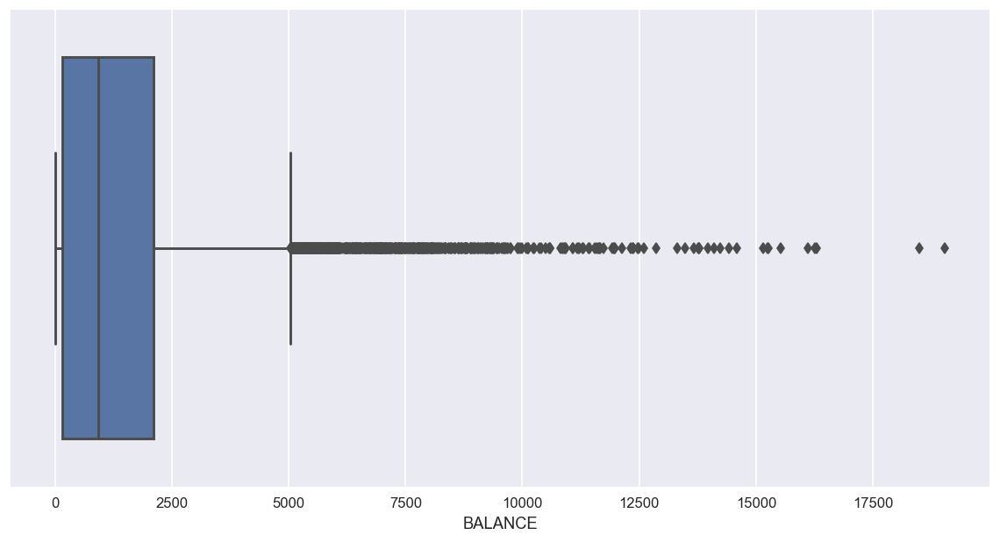

In [22]:
i = 0  #Change the value of i to check the box plot of each feature. max = 16
plt.figure(figsize = (12, 6), dpi = 120)
sns.boxplot(x = data.columns[i], data = data)
plt.show()

* Outliers of each feature :
--- **BALANCE** > 17500
--- **BALANCE_FREQUENCY** == 0
--- **PURCHASES** > 30000
--- **ONEOFF_PURCHASES** > 30000
--- **INSTALLMENTS_PURCHASES** > 20000
--- **CASH_ADVANCE** > 40000
--- **CASH_ADVANCE_FREQUENCY** > 1.4
--- **CASH_ADVANCE_TRX** > 80
--- **CREDIT_LIMIT** >= 25000
--- **PAYMENTS** > 45000
--- **MINIMUM_PAYMENTS** > 35000

In [23]:
data['BALANCE'].nlargest(5)

122     19043.13856
3992    18495.55855
5309    16304.88925
6410    16259.44857
5107    16115.59640
Name: BALANCE, dtype: float64

<AxesSubplot:>

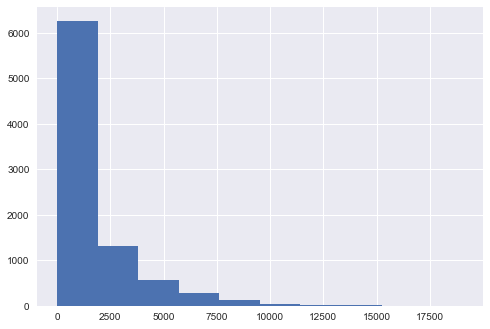

In [24]:
data['BALANCE'].hist(bins = 10)

In [25]:
mask = data['BALANCE'] <= 17500
data[mask]['BALANCE'].describe()

count     8634.000000
mean      1597.248028
std       2079.451860
min          0.000000
25%        147.923961
50%        916.693628
75%       2100.631605
max      16304.889250
Name: BALANCE, dtype: float64

In [26]:
data['BALANCE'].describe()

count     8636.000000
mean      1601.224893
std       2095.571300
min          0.000000
25%        148.095189
50%        916.855459
75%       2105.195853
max      19043.138560
Name: BALANCE, dtype: float64

--- **BALANCE**: Comparing the potential noises with the statistics, and the difference in statistics of the feature without the outliers, concludes that they are not noises but only outliers. 

In [27]:
mask = data['BALANCE_FREQUENCY'] < 0.1
sum(mask)

31

In [28]:
data['BALANCE_FREQUENCY'].nsmallest(10)

1480    0.000000
4779    0.000000
6824    0.000000
7201    0.000000
7429    0.000000
7584    0.000000
181     0.090909
695     0.090909
723     0.090909
1014    0.090909
Name: BALANCE_FREQUENCY, dtype: float64

<AxesSubplot:>

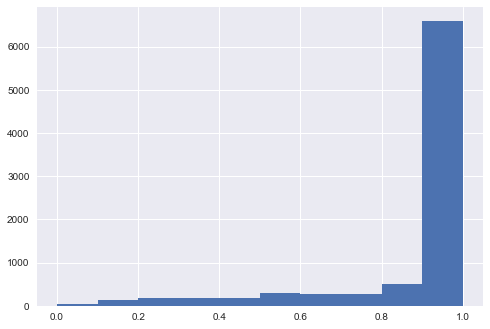

In [29]:
data['BALANCE_FREQUENCY'].hist(bins = 10)

In [30]:
mask = data['BALANCE_FREQUENCY'] == 0
data[mask == False]['BALANCE_FREQUENCY'].describe()

count    8630.000000
mean        0.895657
std         0.206423
min         0.090909
25%         0.909091
50%         1.000000
75%         1.000000
max         1.000000
Name: BALANCE_FREQUENCY, dtype: float64

In [31]:
data['BALANCE_FREQUENCY'].describe()

count    8636.000000
mean        0.895035
std         0.207697
min         0.000000
25%         0.909091
50%         1.000000
75%         1.000000
max         1.000000
Name: BALANCE_FREQUENCY, dtype: float64

--- **BALANCE_FREQUENCY**: The values in this column that are equal to zero are not noises, and also they are not far enough to be considered as outliers.

In [32]:
data['PURCHASES'].nlargest(5)

512     49039.57
464     41050.40
1166    40040.71
1509    38902.71
3792    35131.16
Name: PURCHASES, dtype: float64

<AxesSubplot:>

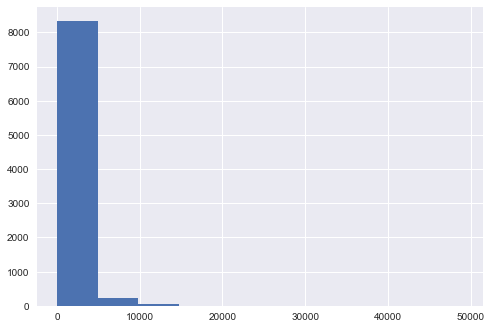

In [33]:
data['PURCHASES'].hist(bins = 10)

In [34]:
data['PURCHASES'].describe()

count     8636.000000
mean      1025.433874
std       2167.107984
min          0.000000
25%         43.367500
50%        375.405000
75%       1145.980000
max      49039.570000
Name: PURCHASES, dtype: float64

In [35]:
mask = data['PURCHASES'] > 30000
data[mask == False]['PURCHASES'].describe()

count     8629.000000
mean       995.207238
std       1883.487877
min          0.000000
25%         43.250000
50%        374.950000
75%       1141.240000
max      27957.680000
Name: PURCHASES, dtype: float64

In [36]:
data[mask]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
246,5131.319584,1.0,32539.78,26547.43,5992.35,0.000000,1.000000,1.000000,1.000000,0.000000,0,98,11500.0,26652.34432,1971.129435,0.083333,12
464,13479.288210,1.0,41050.40,40624.06,426.34,0.000000,0.833333,0.666667,0.416667,0.000000,0,157,17000.0,36066.75068,15914.484620,0.083333,12
512,11547.520010,1.0,49039.57,40761.25,8278.32,558.166886,1.000000,1.000000,0.916667,0.083333,1,101,22500.0,46930.59824,2974.069421,0.250000,12
1166,4010.621974,1.0,40040.71,24543.52,15497.19,0.000000,1.000000,1.000000,1.000000,0.000000,0,358,18000.0,33994.72785,703.503256,1.000000,12
1509,3391.702180,1.0,38902.71,33803.84,5098.87,0.000000,1.000000,1.000000,1.000000,0.000000,0,195,18000.0,35843.62593,716.027656,1.000000,12
1545,3454.094319,1.0,31299.35,19064.30,12235.05,0.000000,1.000000,0.666667,0.833333,0.000000,0,121,7500.0,22542.58705,1193.031030,0.583333,12
3792,2997.977825,1.0,35131.16,34087.73,1043.43,0.000000,1.000000,1.000000,0.833333,0.000000,0,344,12000.0,28896.66522,767.014180,0.750000,12


---**PURCHASES**: There is a suspicious information about one of the samples above, and that is the both *PURCHASES* and *PAYMENTS* are in the range of outliers! (index = 512). Also, potential outliers have a considerable effect on the statistics specially mean value of this column. (index = 246, 464, 512, 1166, 1509, 1545, 3792)

In [37]:
data['ONEOFF_PURCHASES'].nlargest(8)

512     40761.25
464     40624.06
3792    34087.73
1509    33803.84
246     26547.43
6818    26514.32
1355    25122.77
1166    24543.52
Name: ONEOFF_PURCHASES, dtype: float64

<AxesSubplot:>

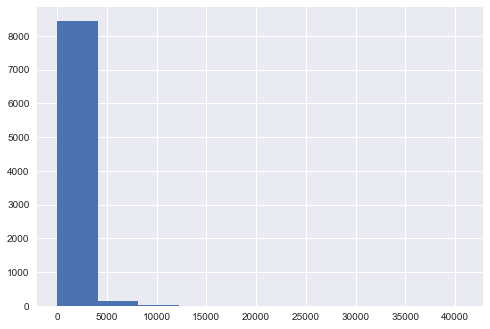

In [38]:
data['ONEOFF_PURCHASES'].hist(bins = 10)

In [39]:
mask = data['ONEOFF_PURCHASES'] > 30000
data[mask]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
464,13479.288210,1.0,41050.40,40624.06,426.34,0.000000,0.833333,0.666667,0.416667,0.000000,0,157,17000.0,36066.75068,15914.484620,0.083333,12
512,11547.520010,1.0,49039.57,40761.25,8278.32,558.166886,1.000000,1.000000,0.916667,0.083333,1,101,22500.0,46930.59824,2974.069421,0.250000,12
1509,3391.702180,1.0,38902.71,33803.84,5098.87,0.000000,1.000000,1.000000,1.000000,0.000000,0,195,18000.0,35843.62593,716.027656,1.000000,12
3792,2997.977825,1.0,35131.16,34087.73,1043.43,0.000000,1.000000,1.000000,0.833333,0.000000,0,344,12000.0,28896.66522,767.014180,0.750000,12


In [40]:
data['ONEOFF_PURCHASES'].describe()

count     8636.000000
mean       604.901438
std       1684.307803
min          0.000000
25%          0.000000
50%         44.995000
75%        599.100000
max      40761.250000
Name: ONEOFF_PURCHASES, dtype: float64

In [41]:
data[mask == False]['ONEOFF_PURCHASES'].describe()

count     8632.000000
mean       587.888316
std       1485.914085
min          0.000000
25%          0.000000
50%         44.850000
75%        598.037500
max      26547.430000
Name: ONEOFF_PURCHASES, dtype: float64

--- **ONEOFF_PURCHASES** : Checking the samples of this filter with filters from previous feature, it is notable that all of the outliers of *ONEOFF_PURCHASES* are also outliers of the *PURCHASES* column!
 (index = 464, 512, 1509, 3792)

In [42]:
data['INSTALLMENTS_PURCHASES'].nlargest(5)

5086    22500.00
1166    15497.19
3059    14686.10
3564    13184.43
2707    12738.47
Name: INSTALLMENTS_PURCHASES, dtype: float64

<AxesSubplot:>

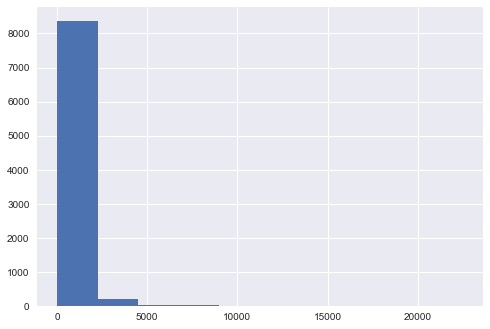

In [43]:
data['INSTALLMENTS_PURCHASES'].hist(bins = 10)

In [44]:
data['INSTALLMENTS_PURCHASES'].describe()

count     8636.000000
mean       420.843533
std        917.245182
min          0.000000
25%          0.000000
50%         94.785000
75%        484.147500
max      22500.000000
Name: INSTALLMENTS_PURCHASES, dtype: float64

In [45]:
mask = data['INSTALLMENTS_PURCHASES'] < 20000
data[mask]['INSTALLMENTS_PURCHASES'].describe()

count     8635.000000
mean       418.286595
std        885.984236
min          0.000000
25%          0.000000
50%         94.710000
75%        483.680000
max      15497.190000
Name: INSTALLMENTS_PURCHASES, dtype: float64

In [46]:
data.sort_values(by = 'INSTALLMENTS_PURCHASES', ascending = False).head(1)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5086,4060.710208,0.727273,22500.0,0.0,22500.0,0.0,0.5,0.0,0.416667,0.0,0,12,23000.0,8760.860264,1645.535202,0.0,12


--- **INSTALLMENTS_PURCHASES**:  The only notable thing about the outlier is that by removing it, statistics of this column changes considerably as the distance between this sample and the nearest samples is quite significant. (index = 5086)

In [47]:
data['CASH_ADVANCE'].nlargest(5)

2054    47137.21176
977     29282.10915
64      27296.48576
7022    26268.69989
7402    26194.04954
Name: CASH_ADVANCE, dtype: float64

<AxesSubplot:>

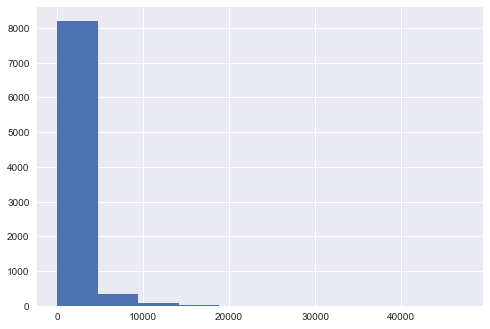

In [48]:
data['CASH_ADVANCE'].hist(bins = 10)

In [49]:
data['CASH_ADVANCE'].describe()

count     8636.000000
mean       994.175523
std       2121.458303
min          0.000000
25%          0.000000
50%          0.000000
75%       1132.385490
max      47137.211760
Name: CASH_ADVANCE, dtype: float64

In [50]:
mask = data['CASH_ADVANCE'] < 45000
data[mask]['CASH_ADVANCE'].describe()

count     8635.000000
mean       988.831801
std       2062.637616
min          0.000000
25%          0.000000
50%          0.000000
75%       1131.895249
max      29282.109150
Name: CASH_ADVANCE, dtype: float64

In [51]:
data.iloc[2054]

BALANCE                             10905.053810
BALANCE_FREQUENCY                       1.000000
PURCHASES                             431.930000
ONEOFF_PURCHASES                      133.500000
INSTALLMENTS_PURCHASES                298.430000
CASH_ADVANCE                        47137.211760
PURCHASES_FREQUENCY                     0.583333
ONEOFF_PURCHASES_FREQUENCY              0.250000
PURCHASES_INSTALLMENTS_FREQUENCY        0.500000
CASH_ADVANCE_FREQUENCY                  1.000000
CASH_ADVANCE_TRX                      123.000000
PURCHASES_TRX                          21.000000
CREDIT_LIMIT                        19600.000000
PAYMENTS                            39048.597620
MINIMUM_PAYMENTS                     5394.173671
PRC_FULL_PAYMENT                        0.000000
TENURE                                 12.000000
Name: 2054, dtype: float64

--- **CASH_ADVANCE**: The only outlier in this column is far away from other samples, and it has a significant effect on the statistics. (index = 2054)

In [52]:
data['CASH_ADVANCE_FREQUENCY'].nlargest(5)

2919    1.500000
640     1.250000
1530    1.166667
3129    1.166667
8086    1.142857
Name: CASH_ADVANCE_FREQUENCY, dtype: float64

<AxesSubplot:>

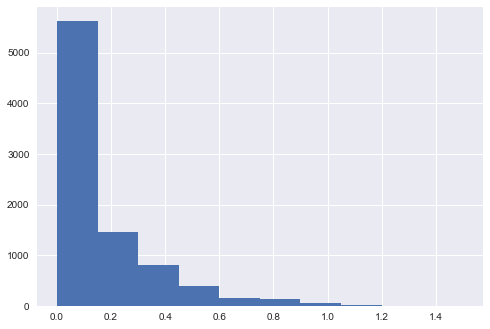

In [53]:
data['CASH_ADVANCE_FREQUENCY'].hist(bins = 10)

In [54]:
data['CASH_ADVANCE_FREQUENCY'].describe()

count    8636.000000
mean        0.137604
std         0.201791
min         0.000000
25%         0.000000
50%         0.000000
75%         0.250000
max         1.500000
Name: CASH_ADVANCE_FREQUENCY, dtype: float64

--- **CASH_ADVANCE_FREQUENCY**: As the potential outlier in this column is not much distant from the rest of the values, and the range of values is small, it dios not have any major effect on the statistics, and in real word, this value is possible.

In [55]:
data['CASH_ADVANCE_TRX'].nlargest(10)

504     123
2054    123
8039    123
3417    110
1812    107
5113     93
5145     80
4951     71
7402     69
3137     63
Name: CASH_ADVANCE_TRX, dtype: int64

In [56]:
data.iloc[[504, 2054, 8039, 3417, 1812, 5113]]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
504,1284.633140,1.000000,55.50,0.00,55.50,5406.459348,0.083333,0.000000,0.083333,0.833333,123,1,3000.0,3432.757202,421.385587,0.000000,12
2054,10905.053810,1.000000,431.93,133.50,298.43,47137.211760,0.583333,0.250000,0.500000,1.000000,123,21,19600.0,39048.597620,5394.173671,0.000000,12
8039,2648.244646,1.000000,0.00,0.00,0.00,10458.978150,0.000000,0.000000,0.000000,1.000000,123,0,4000.0,9818.531412,665.888853,0.000000,12
3417,4175.826879,1.000000,0.00,0.00,0.00,9968.184827,0.000000,0.000000,0.000000,0.909091,110,0,10500.0,1083.433387,1000.206323,0.000000,11
1812,1856.325339,0.818182,670.50,516.90,153.60,5603.126858,0.545455,0.272727,0.363636,0.727273,107,9,7000.0,9221.922948,537.180986,0.142857,11
5113,7268.706380,1.000000,306.91,306.91,0.00,12702.427700,0.272727,0.272727,0.000000,1.000000,93,4,12000.0,3512.633784,2096.962594,0.000000,11


<AxesSubplot:>

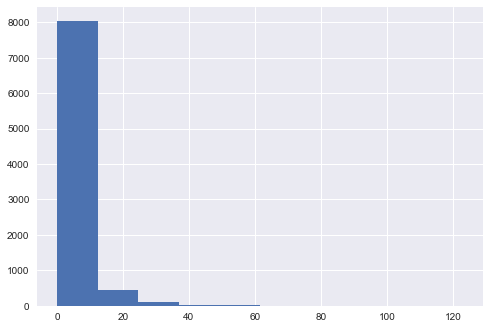

In [57]:
data['CASH_ADVANCE_TRX'].hist(bins = 10)

In [58]:
data['CASH_ADVANCE_TRX'].describe()

count    8636.000000
mean        3.313918
std         6.912506
min         0.000000
25%         0.000000
50%         0.000000
75%         4.000000
max       123.000000
Name: CASH_ADVANCE_TRX, dtype: float64

In [59]:
mask = data['CASH_ADVANCE_TRX'] <= 80
data[mask]['CASH_ADVANCE_TRX'].describe()

count    8630.000000
mean        3.237543
std         6.271590
min         0.000000
25%         0.000000
50%         0.000000
75%         4.000000
max        80.000000
Name: CASH_ADVANCE_TRX, dtype: float64

--- **CASH_ADVANCE_TRX**: The outliers in this column did not alter the mean value much, but their effect on the standard deviation is significant. (index = 504, 2054, 8039, 3417, 1812, 5113)

In [60]:
data['CREDIT_LIMIT'].nlargest(10)

4747    30000.0
6818    30000.0
900     28000.0
3527    25000.0
176     23000.0
5086    23000.0
512     22500.0
3992    22000.0
126     21500.0
1422    21500.0
Name: CREDIT_LIMIT, dtype: float64

--- **CREDIT_LIMIT** : Although the boxplot shows some outliers, but the distance between the potential outliers and the rest of the samples is not far.

In [61]:
data['PAYMENTS'].nlargest(5)

4072    50721.48336
512     46930.59824
4514    40627.59524
5183    39461.96580
2054    39048.59762
Name: PAYMENTS, dtype: float64

In [62]:
data.iloc[[512, 4072]]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
512,11547.520010,1.000000,49039.57,40761.25,8278.32,558.166886,1.000000,1.000000,0.916667,0.083333,1,101,22500.0,46930.59824,2974.069421,0.25,12
4072,1268.809031,0.272727,17945.00,17945.00,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,18000.0,50721.48336,1149.747342,0.00,12


<AxesSubplot:>

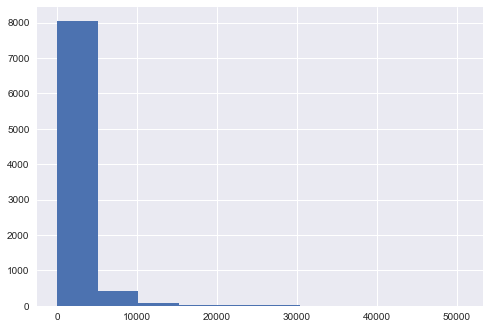

In [63]:
data['PAYMENTS'].hist(bins = 10)

In [64]:
data['PAYMENTS'].describe()

count     8636.000000
mean      1784.478099
std       2909.810090
min          0.049513
25%        418.559237
50%        896.675701
75%       1951.142090
max      50721.483360
Name: PAYMENTS, dtype: float64

In [65]:
mask = data['PAYMENTS'] < 45000
data[mask]['PAYMENTS'].describe()

count     8634.000000
mean      1773.581281
std       2820.521674
min          0.049513
25%        418.484380
50%        895.707030
75%       1947.827567
max      40627.595240
Name: PAYMENTS, dtype: float64

--- **PAYMENTS**: The effect of the outliers on the mean and std of the column is not negligible. Also, as the secong largest value of this column is volunteer to be excluded from the data, as the value for *PURCHASES* of this sample is also an outlier, the largest one needs to be removed as well, Otherwise, the distance between the largest value and the next one would be so much. (index = 512, 4072)

In [66]:
data['MINIMUM_PAYMENTS'].nlargest(10)

4226    76406.20752
6902    61031.61860
5474    56370.04117
4311    50260.75947
5640    43132.72823
5775    42629.55117
529     38512.12477
5124    31871.36379
1045    30528.43240
6416    29019.80288
Name: MINIMUM_PAYMENTS, dtype: float64

<AxesSubplot:>

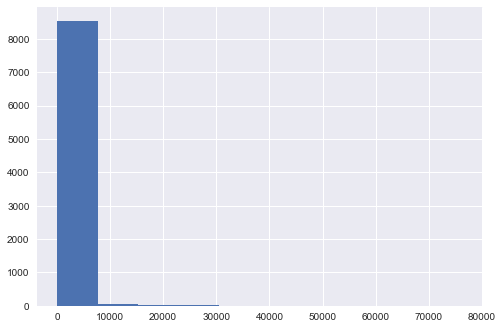

In [67]:
data['MINIMUM_PAYMENTS'].hist(bins = 10)

In [68]:
data['MINIMUM_PAYMENTS'].describe()

count     8636.000000
mean       864.304943
std       2372.566350
min          0.019163
25%        169.163545
50%        312.452292
75%        825.496463
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64

In [69]:
mask = data['MINIMUM_PAYMENTS'] > 35000
data[mask == False]['MINIMUM_PAYMENTS'].describe()

count     8629.000000
mean       822.319441
std       1826.881731
min          0.019163
25%        169.079690
50%        311.963409
75%        819.267218
max      31871.363790
Name: MINIMUM_PAYMENTS, dtype: float64

In [70]:
data[mask]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
529,3457.086184,1.0,2448.60,0.0,2448.60,0.000000,1.0,0.0,1.0,0.000000,0,12,1700.0,227.514473,38512.12477,0.0,12
4226,10571.411070,1.0,7739.48,0.0,7739.48,0.000000,1.0,0.0,1.0,0.000000,0,44,8000.0,2688.447014,76406.20752,0.0,12
4311,4976.028578,1.0,900.87,0.0,900.87,0.000000,1.0,0.0,1.0,0.000000,0,162,5500.0,92.865469,50260.75947,0.0,12
5474,4628.109931,1.0,912.54,0.0,912.54,0.000000,1.0,0.0,1.0,0.000000,0,21,5000.0,3746.305759,56370.04117,0.0,12
5640,8038.893195,1.0,0.00,0.0,0.00,197.915586,0.0,0.0,0.0,0.166667,8,0,9000.0,3569.182969,43132.72823,0.0,12
5775,6022.224462,1.0,0.00,0.0,0.00,4111.465632,0.0,0.0,0.0,0.166667,6,0,7000.0,4560.775720,42629.55117,0.0,12
6902,9024.812044,1.0,0.00,0.0,0.00,2750.442399,0.0,0.0,0.0,0.083333,2,0,9000.0,302.484224,61031.61860,0.0,12


--- As some of the samples above, with regard to some features like balance, are in the range with lower density of data, removing all of them may have an adverse effect on the model.

In [71]:
mask = data['MINIMUM_PAYMENTS'] > 50000
data[mask == False]['MINIMUM_PAYMENTS'].describe()

count     8632.000000
mean       836.430591
std       1977.534021
min          0.019163
25%        169.112703
50%        312.096808
75%        821.776198
max      43132.728230
Name: MINIMUM_PAYMENTS, dtype: float64

--- **MINIMUM_PAYMENTS**: Excluding the outliers in this column, lower the mean value and std but not considerably. However, due the distance of the sample with its neighbors, removing them may be the better approach. (index = 4226, 6902, 5474, 4311)

--- Now that we have the potential noises, in the modeling section they will be excluded from the data and wil be kept in a seperate dataframe. Reason behind this is that in case of using density based clustering method, which are robust to outliers, they do not need to be excluded and can be go through modeling process just like other samples. As a result, these samples will just be excluded for some of the algorithms and not all of them.

--- Indices : 246, 464, 512, 1166, 1509, 1545, 3792, 3792, 5086, 2054, 504, 8039, 3417, 1812, 5113, 4072, 4226, 6902, 5474, 4311

--- It should be noted that, during the modeling process, some of the data might be recognized as noises specially with Kmeans algorithm. So more data might be excluded in the next sections.

In [72]:
df_1 = data.drop([246, 464, 512, 1166, 1509, 1545, 3792, 3792, 5086, 2054, 504, 8039, 3417, 1812, 5113,
                  4072, 4226, 6902, 5474, 4311])
df_1.reset_index(drop = True, inplace = True)
df_1

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8612,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8613,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8614,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8615,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


#### **In-Depth Visual Analysis**

In [ ]:
# Aiming to reduce the size of the notebook file, a try-except block is
# defined here to check the scatter plot of each possible pair of features.

# In order to check for remaining outliers, df_1 is being used instead of the original data.

try:
    #x = int(input('feature No: '))
    #y = int(input('feature No: '))
    x, y = 14, 15
    feature_1, feature_2 = data.columns[x], data.columns[y]
    plt.figure(figsize = (12, 8), dpi = 400)
    plt.scatter(df_1[feature_1], df_1[feature_2], color = 'blue', edgecolors = 'red', alpha = 0.6)
    plt.xlabel(feature_1)
    plt.ylabel(feature_2)
except:
    print('Invalid Number!')

In [ ]:
# This cell is being used for limiting the range of x and y in the scatter plot aiming to zoom in and
# get better insight about the data.

plt.figure(figsize = (12, 8), dpi = 400)
plt.scatter(df_1[feature_1], df_1[feature_2], color = 'blue', edgecolors = 'red', alpha = 0.6)
plt.xlabel(feature_1)
plt.ylabel(feature_2)
plt.xlim(0, 5000)
plt.ylim(0, 2500)
plt.show()

* **Scatter Plots Interpretations**

--- **BALANCE - BALANCE_FREQUENCY** : Based on the plots, there are numerous sample with BALANCE_FREQUENCY = 1 which are located quite far from the rest of the samples, and they might get categorized in a seperate cluster. Also, around BALANCE_FREQUENCY = 0.5 there is a gap between two areas with different densities.

--- **BALANCE - PURCHASES** : There are some outliers far from the rest of the data that can distort the performance of distance based clustering mehtods. Zooming in (x: 0 - 2500, y: 0 - 2500), it can be seen that there is a high density area around BALANCE = 0, and there is another area with lower density around BALANCE = 1000 - 1500. From this point of view, at least 3 clusters will be needed.  

--- **BALANCE - ONEOFF_PURCHASES** : Just like *BALANCE - PURCHASES*

--- **BALANCE - INSTALLMENTS_PURCHASES** : On these plots samples are so close that it is not possible to guess any number of groups.

--- **BALANCE - CASH_ADVANCE** : High density area on BALANCE = 0 - 2000, and CASH_ADVANCE = 0 - 2000. Also another dense area which is way smaller than the first one is around BALANCE = 2800.

--- **BALANCE - PURCHASES_FREQUENCY** : The only notable thing about this plot is that the the samples on the lines PURCHASES_FREQUENCY = 0 OR 1 are pretty distant from other samples. Also around PURCHASES_FREQUENCY = 0.1 OR 0.9 are two dense area.

--- **BALANCE - ONEOFF_PURCHASES_FREQUENCY** : Just like *BALANCE - PURCHASES_FREQUENCY*, but no dense area around 0.9.

--- **BALANCE - PURCHASES_INSTALMENTS_FREQUENCY** : Just like *BALANCE - PURCHASES_FREQUENCY*, but no dense area around 0.1.

--- **BALANCE - CASH_ADVANCE_FREQUENCY** : Above CASH_ADVANCE_FREQUENCY = 0.6, the number of samples decreases significantly. Also, samples with CASH_ADVANCE_FREQUENCY = 0 are relatively far from the rest. In addition, while BALANCE < 2000, there is a high density are around CASH_ADVANCE_FREQUENCY = 0.1.

--- **BALANCE - CASH_ADVANCE_TRX** : As the CASH_ADVANCE_TRX goes above 5, BALANCE also gets far from 0. 

--- **BALANCE - PURCHASES_TRX** : Examining the plots precisely, it can be guessed that one of the centroids might be around BALANCE = 500, and PURCHASES_TRX = 15.

--- **BALANCE - CREDIT_LIMIT** : One important thing about this plot is that with increasing in BALANCE, minimum values of CREDIT_LIMIT also witness an increase. With CREDIT_LIMIT < 3000, there is a data congestion area.

--- **BALANCE - PAYMENTS** : On the plot without limited range it can be seen that while BALANCE > 5000 , minimum values of PAYMENTS increase with values in BALANCE column. Zooming in, two potential groups of data can be seen that one of them is around BALANCE = 50, and the other one is in the area with 1000 < BALANCE < 1750, and 50 < PAYMENTS < 750.

--- **BALANCE - MINIMUM_PAYMENTS** : There is a linear correaltion between these features. 

--- **BALANCE - PRC_FULL_PAYMENT** : Samples with PRC_FULL_PAYMENT = 0 OR 1 are seperated from other samples. Also, around PRC_FULL_PAYMENT = 0.5 a significant decrease in the density of the samples occured that my lead to need for 2 separate clusters.


* ***Now that all features has been interpreted based on their plot against BALANCE, only plots with notable information are being explained here. Also, plots with quite same information will be explained just once.***

--- **BALANCE_FREQUENCY - PURCHASES_FREQUENCY** : On this plot, at least 4 different congestion area are visible. On area in the line of BALANCE_FREQUENCY = 1, and also there is a gap between 2 more areas on  PURCHASES_FREQUENCY = 0.5. However, while BALANCE_FREQUENCY < 0.5, the density of samples are so relatively lower than pther areas and they may better to be in one seperate cluster.

--- **BALANCE_FREQUENCY - ONEOFF_PURCHASES_FREQUENCY** : In addition to the state of values with BALANCE_FREQUENCY = 1, there is some sort of correlation between BALANCE_FREQUENCY and the maximum valus of ONEOFF_PURCHASES_FREQUENCY for each value on x axis. That is to say, Samples with BALANCE_FREQUENCY > 0.5 can hardly be separated to 2 different clusters.

--- **BALANCE_FREQUENCY - PURCHASES_INSTALLMENTS_FREQUENCY** : Just like *BALANCE_FREQUENCY - PURCHASES_FREQUENCY*.

--- **BALANCE_FREQUENCY - CASH_ADVANCE_FREQUENCY** : Just like *BALANCE_FREQUENCY - ONEOFF_PURCHASES_FREQUENCY*.

--- **BALANCE_FREQUENCY - PRC_FULL_PAYMENT** : There are two lines which are far from other samples, BALANCE_FREQUENCY = 1, and PRC_FULL_PAYMENT = 0. In addition, the rest is just like *BALANCE_FREQUENCY - PURCHASES_FREQUENCY*.

--- **PURCHASES - ONEOFF_PURCHASES** : There is a almost linear corelation between these features, and is note worthy that only less than 5 samples are exist with ONEOFF_PURCHASES > PURCHASES. High density area while PURCHASES < 5000, and ONEOFF_PURCHASES < 8000.

--- **PURCHASES - INSTSALLMENTS_PURCHASES** : Similar to *PURCHASES - ONEOFF_PURCHASES*, but the correlation is not as much linear as it is with the aformentioned features. When INSTALLMENTS_PURCHASES increases to more than 5000, density of samples decreases significantly.

--- **PURCHASES - PURCHASES_TRX** : There is a solid congestion area with PURCHASES < 1500, and PURCHASES_TRX < 35. Also, severe outliers are visible. 

--- **PURCHASES - CREDIT_LIMIT** : While CREDIT_LIMIT < 3000, density of samples are much higher. There is a curved shape area on the normal plot with center around PURCHASES = 0, and CREDIT_LIMIT ~= 8000.

--- **PURCHASES - PAYMENTS** : There is a diagonal line starting from (0, 0) with high density of samples. Also, While PURCHASES goes above 5000, Number of samples decreases significantly.

--- **PURCHASES - TENURE** : Almost all samples with TENURE < 12 have PURCHASES < 10000.

--- **ONEOFF_PURCHASES - CASH_ADVANCE** : While ONEOFF_PURCHASES < 1000, density of samples is much higher than other areas.

--- **ONEOFF_PURCHASES - MINIMUM_PAYMENTS** : Below MINIMUM_PAYMENTS = 2000, number of samples is much higher than other areas. Zooming in, it can be seen that there is a congestion area with ONEOFF_PURCHASES < 750, and MINIMUM_PAYMENTS < 1000.

--- **INSTALLEMTS_PURCHASES - CASH_ADVACNE** : The most dense area located around (0, 0), with INSTALLMENT_PURCHASES < 500, and CASH_ADVANCE < 1500.

--- **INSTALLMENTS_PURCHASES - PURCHASES_TRX** : Inspecting the plot accurately, it can be seen that there is a high density area around INSTALMENTS_PURCHASES = 0, and PURCHASES_TRX < 30. With increasing INSTALLMENT_PURCHASES to more than 1000 also, samples lose their density.

--- **INSTALLMENTS_PURCHASES - PAYMENTS** : Around (0, 0), density of the data is significantly high. The most dense area is the area with INSTALLMENT_PURCHASES < 750, and PAYMENTS < 1000.

--- **INSTALLMENTS_PURCHASES - MINIMUM_PAYMENTS** : It os notable that below MINIMUM_PAYMENTS = 300, the number of samples is no way near the other areas.

--- **CASH_ADVANCE - CASH_ADVANCE_FREQUENCY** : There are 2 groups of samples distant from each other, separated by CASH_ADVANCE_FREQUENCY = 0.5. Also, around CASH_ADVANCE_FREQUENCY = 0.1 there is high density of samples.

--- **PURCHASES_FREQUENCY - ONEOFF_PURCHASES_FREQENCY** : There is a linear correlation betwen PURCHASES_FREQUENCY, and the maximum values of ONEOFF_PURCHASES_FREQUENCY. In addition, samples are highly separable on this plot. At least 4 different groups of data are visible among which, one falls on PURCHASES_FREQUENCY = 1.0.

--- **PURCHASES_FREQUENCY - CASH_ADVANCE_FREQUENCY** : On this plot, samples are seperated along x axis, two groups of samples are on PURCHASES_FREQUENCY = 0.0 OR 1. The other groups also divided by PURCHASES_FREQUENCY = 0.5.

--- **ONEOFF_PURCHASES_FREQUENCY - PURCHASES_INSTALLMENTS_FREQUENCY** : On this plot gruops of samples are much more separable than their counterparts.

--- **ONEOFF_PURCHASES_FREQUENCY - PRC_FULL_PAYMENT** : Similar to the previous plot.

--- **CASH_ADVANCE_FREQUENCY - CASH_ADVANCE_TRX** : Most of the samples falls between x and y axis, and CASH_ADVANCE_FREQUENCY = 1.0, and CASH_ADVANCE_TRX = 50. In this area, separablity of smaples are relatively high.14

--- **CASH_ADVANCE_TRX - CREDIT_LIMIT** : Along x axis, while CASH_ADVANCE_TRX < 7.5, samples are more dense, and as CASH_ADVANCE_TRX increases, number of samples decrases.

--- **CREDIT_LIMIT - PAYMENTS** : A group of samples with high density are located around (0, 0) up to (4000, 4000).

--- **PAYMENTS - MINIMUM_PAYMENTS** : Zooming on the plot, it can be guessed that a centroid could be around (1000, 500).

--- Analyzing scatter plots has shown that the data still cotains some outliers in 2D space.

--- Remining outliers : 
    
    Largest value of BALANCE
    BALANCE > 10000, PURCHASES_TRX > 250
    PURCHASES > 20000, CASH_ADVANCE > 18000
    PURCHASES > 20000, CASH_ADVANCE_TRX > 30
    PURCHASES > 25000, CREDIT_LIMIT > 25000
    PURCHASES > 20000, PAYMENTS > 35000
    ONEOFF_PURCHASES > 20000, CASH_ADVANCE_FREQUENCY > 0.6
    ONEOFF_PURCHASES > 25000, CREDIT_LIMIT > 25000
    INSTALLMENTS_PURCHASES > 8000, CASH_ADVANCE > 14500
    INSTALLMENTS_PURCHASES > 12000, PURCHASES_FREQUENCY < 0.4
    INSTALLMENTS_PURCHASES > 12000, PURCHASES_INSTALLMENTS_FREQUENCY < 0.2
    CASH_ADVANCE > 25000, 0.6 < PURCHASES_FREQUENCY < 0.8
    CASH_ADVANCE > 14000, PURCHASES_TRX > 300
    PURCHASES_FREQUENCY < 0.4, PURCHASES_TRX > 150
    PURCHASES_FREQUENCY < 0.8, PURCHASES_TRX > 300
    largest value of CASH_ADVANCE_FREQUENCY
    CASH_ADVANCE_TRX > 40, PURCHASES_TRX > 300

--- Indices of the outliers : 122, 2698, 3050, 5167, 896, 6801, 4350, 1605, 64, 7467, 4614, 2910 

In [75]:
df_2 = df_1.drop([122, 2698, 3050, 5167, 896, 6801, 4350, 1605, 64, 7467, 4614, 2910])
df_2.reset_index(drop = True, inplace = True)
df_2

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
4,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8600,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6
8601,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8602,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8603,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


--- Now for clustering we have 3 dataframes. One is *data* with all the samples, the other one is *df_1* without outliers in each column, and the last one is *df_2* without outliers in 2D space.

--- Now based on all the plots that has been drawn and analyzed, those with acceptable degree of separability of samples will be drawn again using seaborn kdeplot. Note that because of the nature of kde plots that are not suitbale to interpret discrete values with, non of the columns with discrete values, excpet *CREDIT_LIMIT*, is being used. (Values in *CREDIT_LIMIT* are relatively close to each other considering the wide range of all values in the column, so they behave like continuous values)

--- Discrete Columns : 10, 11, 16

--- Features Pairs : (0, 2), (0, 5), (0, 6), (0, 7), (0, 9), (1, 6), (1, 7), (1, 8), (1, 9),
(1, 15), (2, 12), (2, 13), (2, 15), (3, 12), (4, 7), (4, 13), (4, 15), (5, 6), (5, 9),
(5, 14), (6, 7), (6, 8), (6, 9), (6, 12), (6, 13), (6, 15), (7, 8), (7, 9), (7, 12), (7, 13), 
(7, 15), (8, 9), (8, 12), (8, 13), (8, 15), (9, 10), (9, 12), (9, 13), (9, 15),
(11, 12), (11, 13), (11, 15), (12, 13), (12, 14), (12, 15), (13, 15)


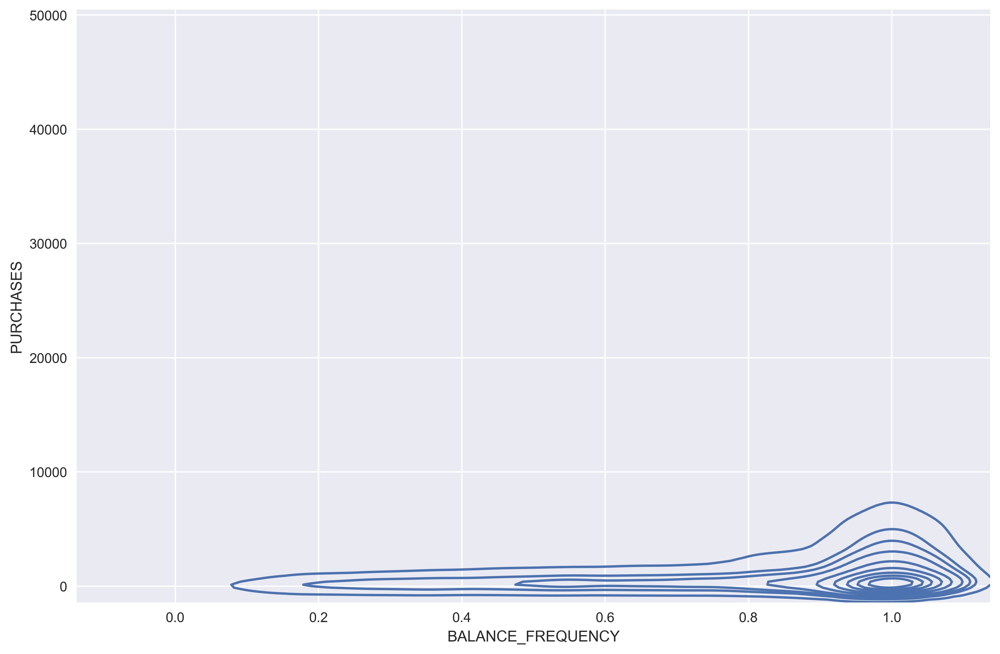

In [76]:
# Aiming to reduce the size of the notebook file, a try-except block is
# defined here to check the scatter plot of each possible pair of features.

try:
    #x = int(input('feature No: '))
    #y = int(input('feature No: '))
    x, y = 1, 2
    feature_1, feature_2 = data.columns[x], data.columns[y]
    fig, ax = plt.subplots(figsize = (12, 8), dpi = 400)
    sns.kdeplot(x = data[feature_1], y = data[feature_2], ax = ax, data = data)
except:
    print('Invalid Number!')

--- Using the results of the cell above, only plots which could provide us with deeper information about the possible clusters are being drawn.

--- Feature Pairs = (0, 6), (0, 7), (1, 6), (1, 7), (1, 8), (1, 15), (2, 15), (4, 7), (4, 15), (5, 6),
(6, 7), (6, 8), (6, 9), (6, 12), (6, 13), (6, 15), (7, 8), (7, 9), (7, 12), (7, 13), (7, 15), (8, 9),
(8, 12), (8, 13), (8, 15), (9, 15), (12, 15), (13, 15)

In [ ]:
feature_pairs = [(0, 6), (0, 7), (1, 6), (1, 7), (1, 8), (1, 15), (2, 15), (4, 7), (4, 15), (5, 6), (6, 7),
                 (6, 8), (6, 9), (6, 12), (6, 13), (6, 15), (7, 8), (7, 9), (7, 12), (7, 13), (7, 15),
                 (8, 9), (8, 12), (8, 13), (8, 15), (9, 15), (12, 15), (13, 15)]

for pair in feature_pairs:
    feature_1, feature_2 = data.columns[pair[0]], data.columns[pair[1]]
    fig, ax = plt.subplots(figsize = (9, 6), dpi = 200)
    sns.kdeplot(x = data[feature_1], y = data[feature_2], ax = ax, data = data, shade = True)

##### Output has been removed in order to reduce the size of this notebook.
Concluding from the plots above, along some of the features groups of samples with high density and enough distance between them are visible. Features include, PURCHASES_FREQUENCY, PURCHASES_INSTALMENTS_FREQUENCY, PRC_FULL_PAYMENT, and ONEOFF_PURCHASES_FREQUENCY.

In [78]:
sns.pairplot(data, palette='Dark2', height = 6, aspect = 1.2, kind = 'scatter', diag_kind = 'kde')

##### Output has been removed in order to reduce the size of this notebook.
--- Based on the digonal plots of the pair plot above, variation of the samples in some columns is relatively low. It might be a good approach for this data to reduce the dimensionality using low variance filter.

In [79]:
fig, ax = plt.subplots(figsize = (24, 18), dpi = 800)
sns.heatmap(data.corr(), center = 1, cbar = True, annot = True, linewidths = 0.5, ax = ax)
plt.show()

##### Output has been removed in order to reduce the size of this notebook.
--- Analysing the correlation between features, there are some pair of features with high correlation that might not be a good thing for modeling. These pairs are, ONEOFF_PURCHASES and PURCHASES, PURCHASES_INSTALLMENTS_FREQUENCY and PURCHASES_FREQUENCY, CASH_ADVANCE_TRX and CASH_ADVANCE_FREQUENCY.

--- Inspecting all the plots above, a good feature to be used as the key feature for plotting and comparison purporses, is *BALANCE*. Reasons for this choice is that this feature is not discrete. Also, based on the kdeplot, values of this feature are more varied in comparison with other continuous features. In addition, this column is correlated with others to a good extent.

### **Part 2 : Machine Learning**

#### **K-Means**

In [80]:
kmeans_constants = {'n_init' : 100, 'random_state' : 1}

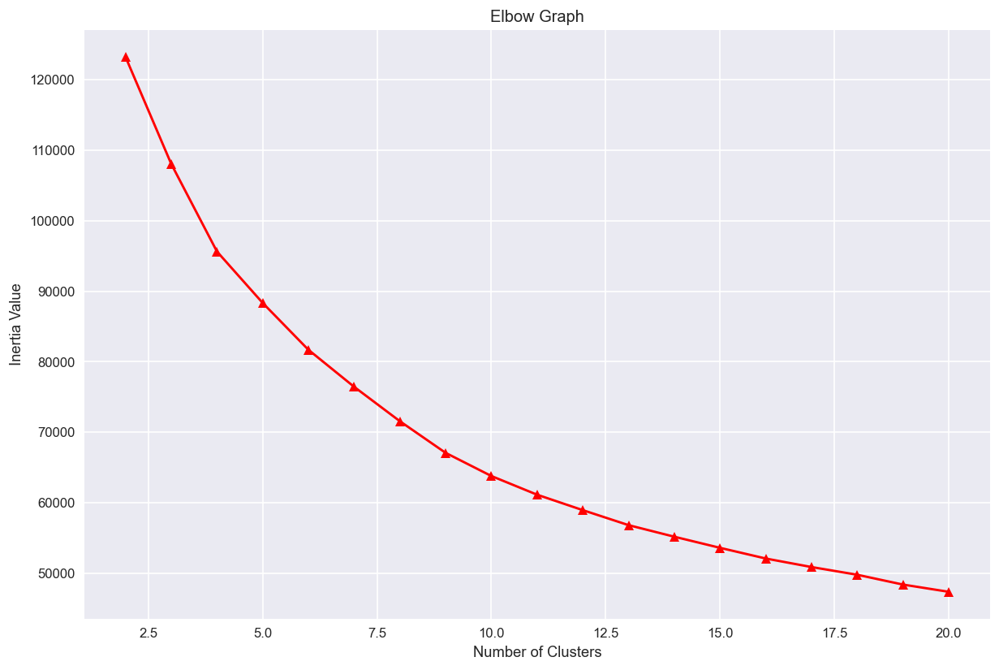

In [81]:
inertia_values = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    inertia_values.append(model.inertia_)

plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), inertia_values, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia Value')
plt.title('Elbow Graph')
plt.show()

In [82]:
kl = KneeLocator(range(2, 21), inertia_values, curve = 'convex', direction = 'decreasing')
kl.elbow

9

--- Elbow graph shows that 9 clusters is the best choice for this dataset.

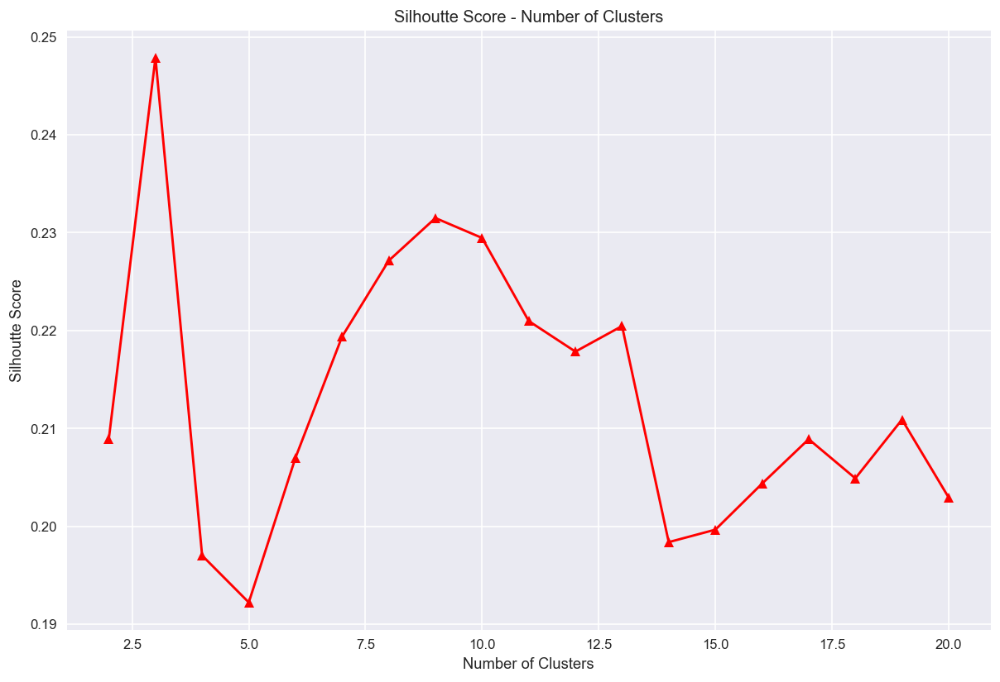

In [83]:
silhoutte_coefs = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))

plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Number of Clusters')
plt.show()

--- Based on the silhouette scores, 3 clusters is the best choice. Considering that silhouette score is a better indicator than elbow graph, we will continue with 3 clusters.

In [84]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = KMeans(n_clusters = 3, **kmeans_constants)
model.fit(X)

KMeans(n_clusters=3, n_init=100, random_state=1)

In [85]:
centroids = scaler.inverse_transform(model.cluster_centers_)
centroids = pd.DataFrame(centroids, columns = data.columns)

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 120)
        plt.subplot(1,2,1)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [87]:
print('Inertia : ', model.inertia_)
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Inertia :  108086.19316841781
Silhouette Score :  0.24786629890647918
CH Score :  1546.543411545993
DB Score :  1.6016321310307229


--- Results of KMeans is not satisfying yet. As outliers have an advrse effect on the performance of KMeans, for improving the result, *df_1* and *df_2* will be used instead of *data*.

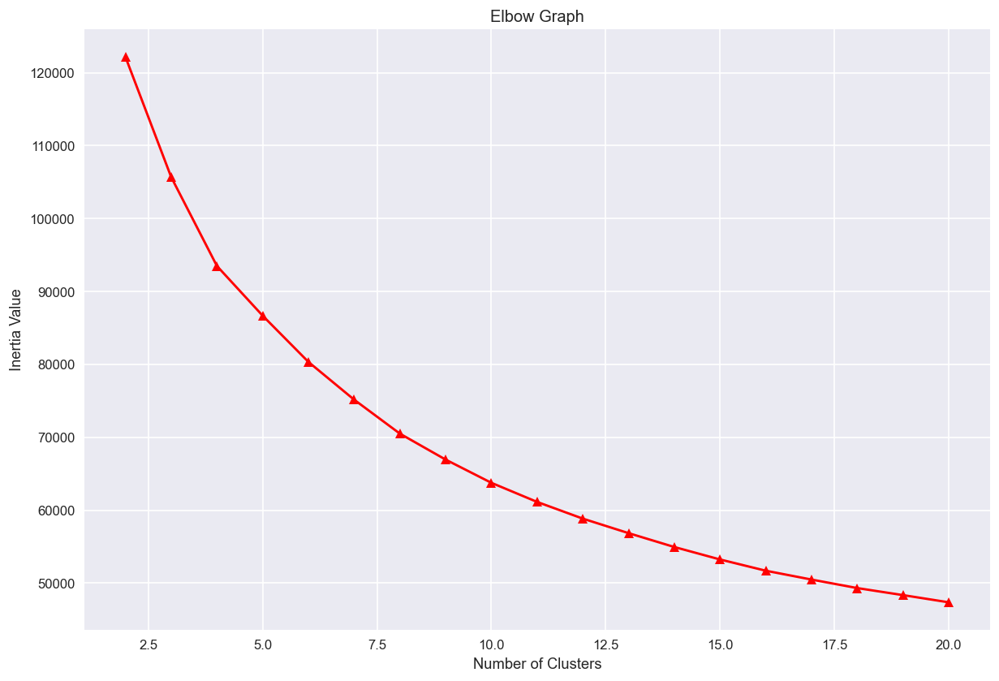

In [88]:
inertia_values = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_1)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    inertia_values.append(model.inertia_)
    
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), inertia_values, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia Value')
plt.title('Elbow Graph')
plt.show()

In [89]:
kl = KneeLocator(range(2, 21), inertia_values, curve = 'convex', direction = 'decreasing')
kl.elbow

8

--- Elbow graph yields slightly different result.

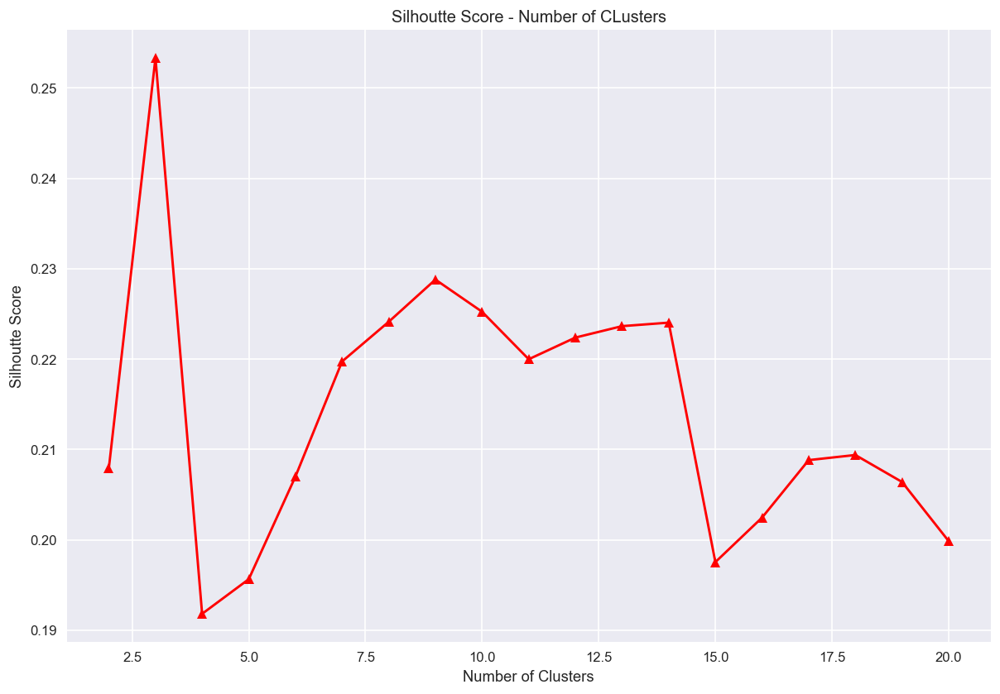

In [90]:
silhoutte_coefs = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_1)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Number of CLusters')
plt.show()

--- Silhouette score plot did not change much. Again the best score achieved with 3 clusters, and the scores improved but not significantly.

In [91]:
scaler = StandardScaler()
X = scaler.fit_transform(df_1)
model = KMeans(n_clusters = 3, **kmeans_constants)
model.fit(X)

KMeans(n_clusters=3, n_init=100, random_state=1)

In [92]:
centroids = pd.DataFrame(scaler.inverse_transform(model.cluster_centers_), columns = df_1.columns)

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_1['BALANCE'], df_1[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_1['BALANCE'], df_1[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [94]:
print('Inertia : ', model.inertia_)
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Inertia :  105691.40335848143
Silhouette Score :  0.253316455199832
CH Score :  1662.5318649953283
DB Score :  1.5888885959729484


--- Clustering improved slightly and it seems that the model can show a better performance in the absence of outlier. Now using *df_2*, also outliers of 2 dimensional space are being excluded.

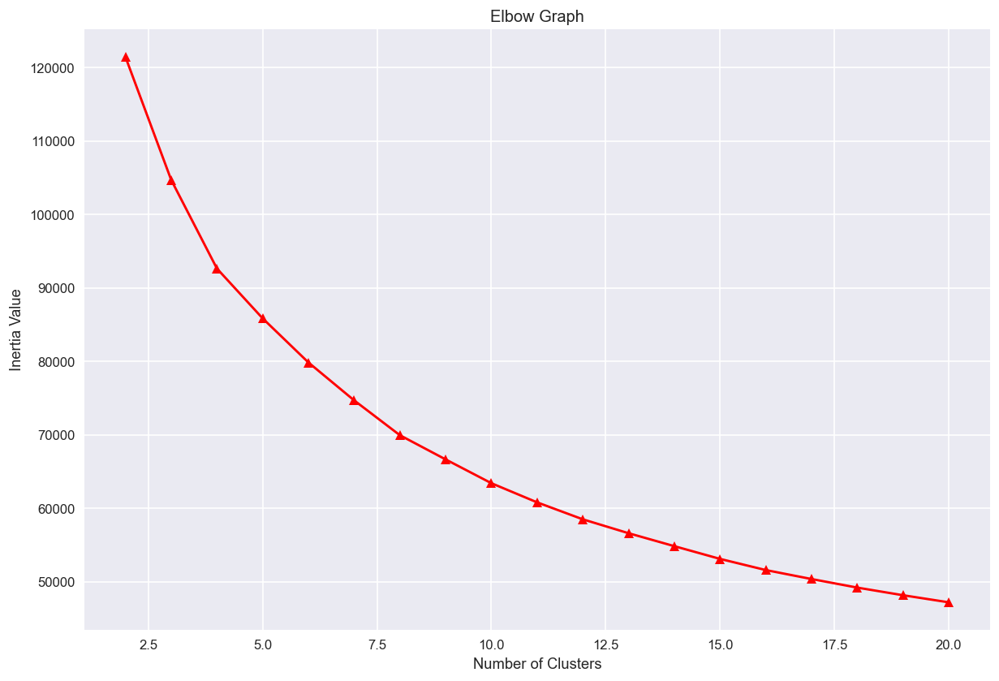

In [95]:
inertia_values = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_2)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    inertia_values.append(model.inertia_)
    
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), inertia_values, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia Value')
plt.title('Elbow Graph')
plt.show()

In [96]:
kl = KneeLocator(range(2, 21), inertia_values, curve = 'convex', direction = 'decreasing')
kl.elbow

8

--- Elbow graph did not change at all !

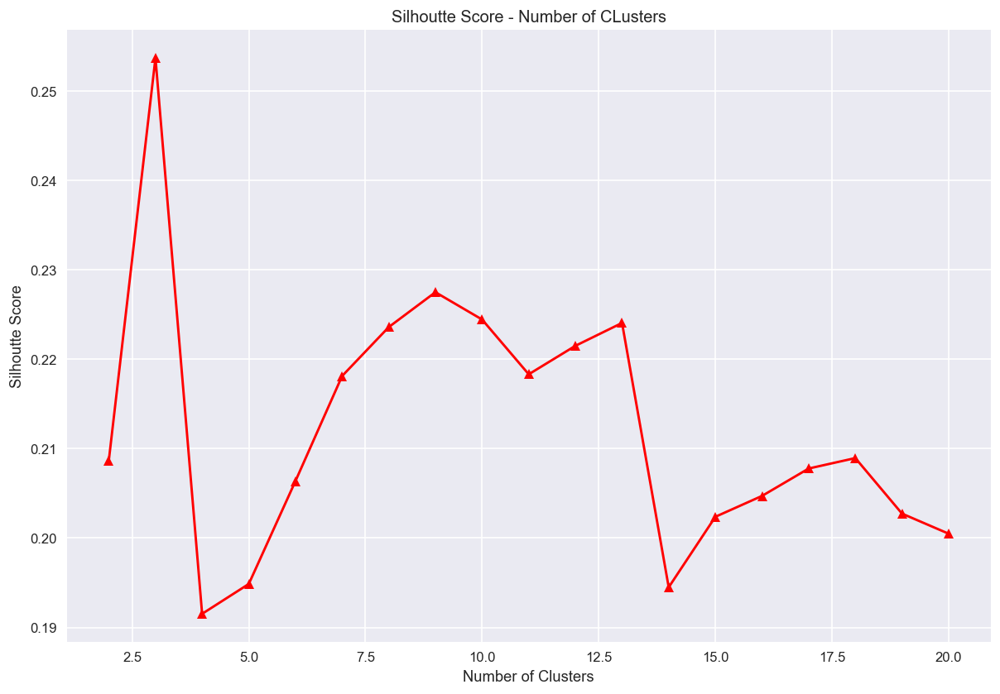

In [97]:
silhoutte_coefs = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_2)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Number of CLusters')
plt.show()

--- Alos Silhouette score plot remained the same !

In [98]:
scaler = StandardScaler()
X = scaler.fit_transform(df_2)
model = KMeans(n_clusters = 3, **kmeans_constants)
model.fit(X)

KMeans(n_clusters=3, n_init=100, random_state=1)

In [99]:
centroids = pd.DataFrame(scaler.inverse_transform(model.cluster_centers_), columns = df_1.columns)

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_2['BALANCE'], df_2[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_2['BALANCE'], df_2[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [101]:
print('Inertia : ', model.inertia_)
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Inertia :  104720.60579079123
Silhouette Score :  0.2537175822448592
CH Score :  1707.1015669746303
DB Score :  1.5848418124128862


--- Metrics improved slightly but the difference is not major by any means. 

--- Considering the silhouette score and inertia value, it seems that there is still rooms for improvement. Aiming to improe the model, a "Low Variance Filter" is being applied on the data.

In [102]:
normalized_data = normalize(df_2)
norm_data = pd.DataFrame(normalized_data, columns = data.columns)
norm_data.var()

BALANCE                             4.765352e-02
BALANCE_FREQUENCY                   4.675371e-08
PURCHASES                           2.726189e-02
ONEOFF_PURCHASES                    1.569307e-02
INSTALLMENTS_PURCHASES              1.215243e-02
CASH_ADVANCE                        4.094858e-02
PURCHASES_FREQUENCY                 2.878704e-08
ONEOFF_PURCHASES_FREQUENCY          4.606084e-09
PURCHASES_INSTALLMENTS_FREQUENCY    2.565937e-08
CASH_ADVANCE_FREQUENCY              3.255513e-09
CASH_ADVANCE_TRX                    1.539531e-06
PURCHASES_TRX                       1.307787e-05
CREDIT_LIMIT                        4.036827e-02
PAYMENTS                            3.815147e-02
MINIMUM_PAYMENTS                    2.406624e-02
PRC_FULL_PAYMENT                    1.329259e-08
TENURE                              7.602120e-06
dtype: float64

--- Now from the original dataset, columns with variances lower than 9e-08 are being excluded.

In [103]:
df_3 = df_2.drop(['ONEOFF_PURCHASES_FREQUENCY', 'CASH_ADVANCE_FREQUENCY'], axis = 1)

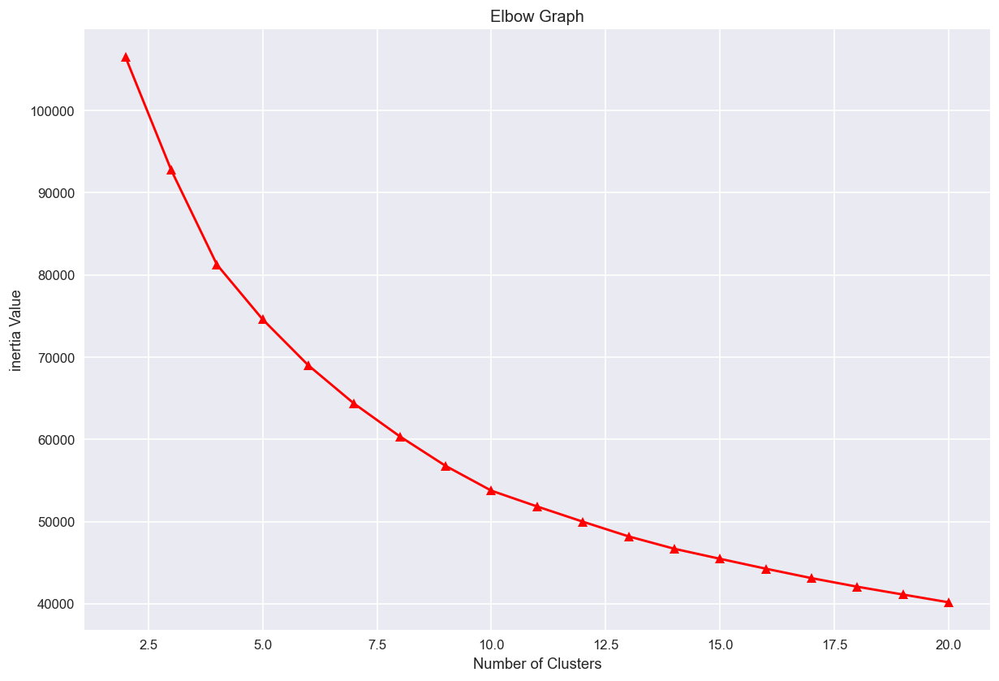

In [104]:
inertia_values = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_3)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    inertia_values.append(model.inertia_)
    
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), inertia_values, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('inertia Value')
plt.title('Elbow Graph')
plt.show()

In [105]:
kl = KneeLocator(range(2, 21), inertia_values, curve = 'convex', direction = 'decreasing')
kl.elbow

8

--- It seems that the low variance filter cannot improve the model based on the elbow graph.

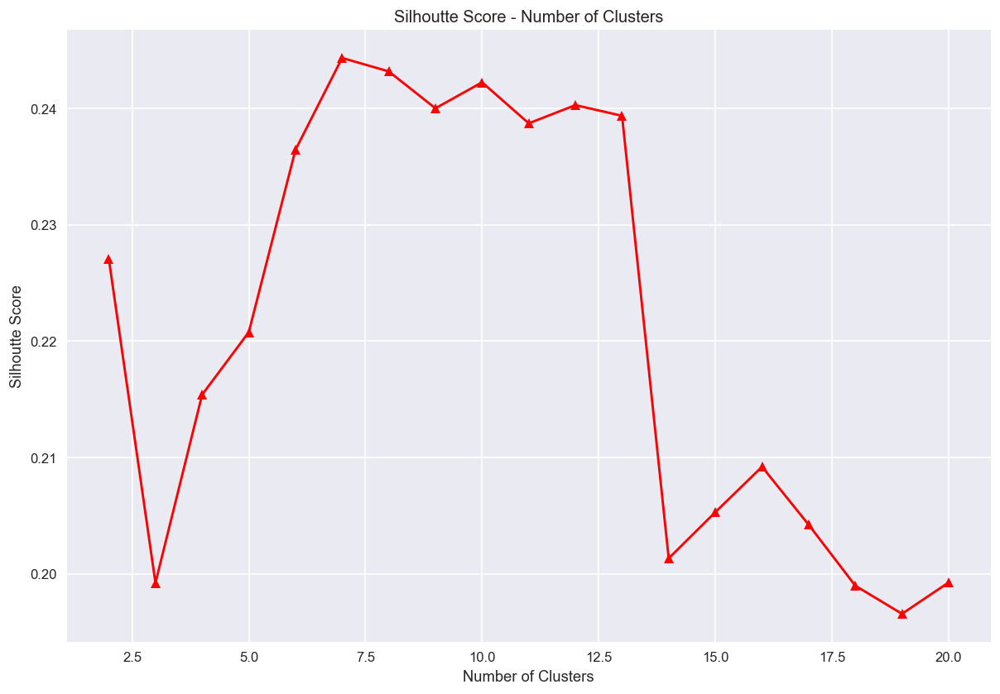

In [106]:
silhoutte_coefs = []

for k in range(2, 21):
    scaler = StandardScaler()
    X = scaler.fit_transform(df_3)
    model = KMeans(n_clusters = k, **kmeans_constants)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 21), silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Number of Clusters')
plt.show()

--- Unlike the elbow graph, Silhouette score plot changed dramatically. Now the optimum number of clusters in both plots are close to each other and this may be the result of *Low Variance Filter*. As the difference between 6 clusters and 7 clusters is not much, 6 is our choice.

In [107]:
scaler = StandardScaler()
X = scaler.fit_transform(df_3)
model = KMeans(n_clusters = 6, **kmeans_constants)
model.fit(X)

KMeans(n_clusters=6, n_init=100, random_state=1)

In [108]:
centroids = pd.DataFrame(scaler.inverse_transform(model.cluster_centers_), columns = df_3.columns)

In [ ]:
plt.style.use('default')
i = 1
while i < len(df_3.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(centroids['BALANCE'], centroids[df_3.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_3['BALANCE'], df_3[df_3.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(df_3.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(centroids['BALANCE'], centroids[df_3.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_3['BALANCE'], df_3[df_3.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(df_3.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.
--- Along some of the features the clustering is more meaningful, while along others this number of clusters might not be reasonable!

In [110]:
print('Inertia : ', model.inertia_)
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Inertia :  68998.04542570564
Silhouette Score :  0.23644205861765025
CH Score :  1497.4392798273805
DB Score :  1.2931160550592267


--- Analyzing the metrics, after applying *Low Variance Filter*, inertia and *Davies_Bouldin* improved significantly. On the other hand, *Calinski-Harabasz* score decrased to a notable extent. In addition, *Silhouette Score* got worse but the difference is not significant. In concluion, it seems that the large number of clusters might end up in an not-meaningful clustering and keeping with less than 6 clusters for this dataset is more efficient.

--- Note that because of the number of features and dimensions of the dataset, initalizing centroids manually is not possibe.

--- The advantage of KMeans is its relatively short run time and probably small computational cost.

--- The problem with KMeans algorithm for this dataset is the effect of outliers on the mean value of each feature. Also, the number of outliers are considerably large and removing all of them might have an adverse effect on the model. As a result, a more robust algorithm might be a better choice for performing the clustering on this data.

--- Among all the sklearn built-in clustering algorithms, *DBSCAN*, *OPTICS*, and *BIRCH* are more robust to outliers.

#### **DBSCAN**

--- First we need to find the optimum value for the hyperparameters. Aiming this, another sklearn bulit-in algorithm is being used for tuning *epsilon*.

In [111]:
neighbors = NearestNeighbors(n_neighbors = 2)
scaler = StandardScaler()
X = scaler.fit_transform(data)
neighbors.fit(X)

NearestNeighbors(n_neighbors=2)

In [112]:
distances, *other = neighbors.kneighbors(X)
distances

array([[0.        , 0.49100527],
       [0.        , 1.26846327],
       [0.        , 0.40229945],
       ...,
       [0.        , 0.94501962],
       [0.        , 1.12599208],
       [0.        , 1.52460719]])

In [113]:
distances = distances[:, 1]
distances.shape

(8636,)

In [114]:
distances = np.sort(distances, axis = 0)
distances

array([9.27071433e-03, 9.27071433e-03, 1.41017780e-02, ...,
       1.23111375e+01, 1.24631465e+01, 1.48642174e+01])

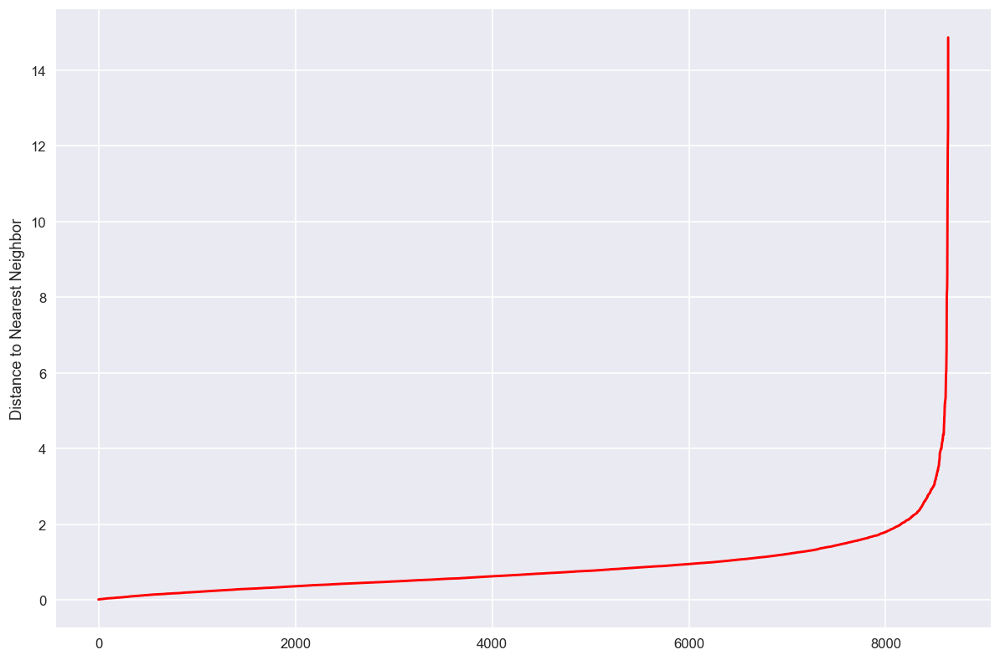

In [115]:
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(distances, color = 'red')
plt.ylabel('Distance to Nearest Neighbor')
plt.show()

In [116]:
kl = KneeLocator(range(len(distances)), distances, curve = 'convex', direction = 'increasing')
kl.elbow

8565

In [117]:
epsilon = distances[kl.elbow]
epsilon

3.9956515629901954

--- Using the plot of the shortest distances and finding the elbow on the graph, optimum value for epsilon has been found

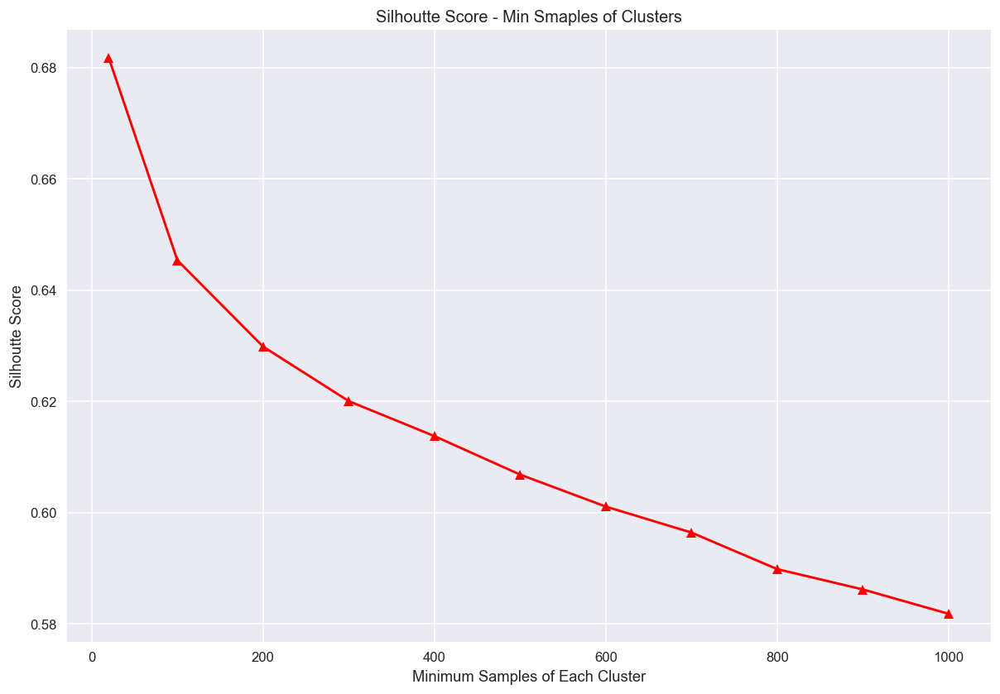

In [118]:
silhoutte_coefs = []

for min_points in [20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = DBSCAN(eps = epsilon, min_samples = min_points)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Min Smaples of Clusters')
plt.show()

In [119]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = DBSCAN(eps = epsilon, min_samples = 20)
model.fit(X)

DBSCAN(eps=3.9956515629901954, min_samples=20)

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [121]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.6817548830077849
CH Score :  751.7597741884789
DB Score :  1.6025913904034832


--- However the silhouette score is better for DBSCAN than KMeans, but it cannot perform the clustering job well enough, and this can be concluded from calinske_harabasz score which is too low. As it can be seen above, the algorithm put most of the samples into one cluster, and label all others as noise. 

--- In order to find the optimum value for *min_smaples*, another plots with *calinski_harabsz_score* and *davies_bouldin_score* are being drawn.

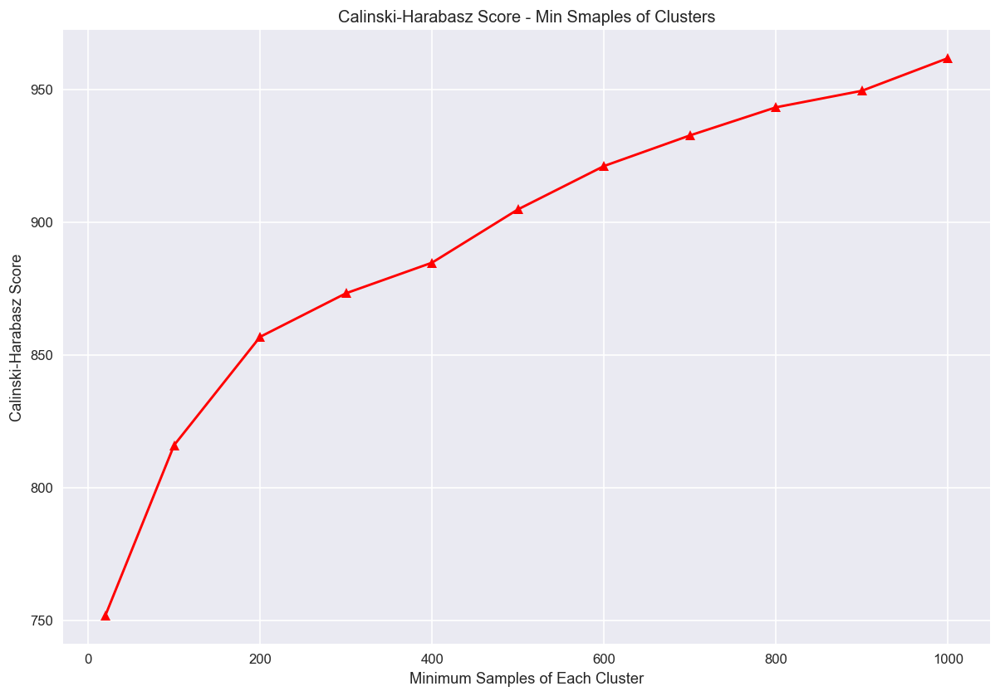

In [122]:
ch_scores = []

for min_points in [20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = DBSCAN(eps = epsilon, min_samples = min_points)
    model.fit(X)
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], ch_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Score - Min Smaples of Clusters')
plt.show()

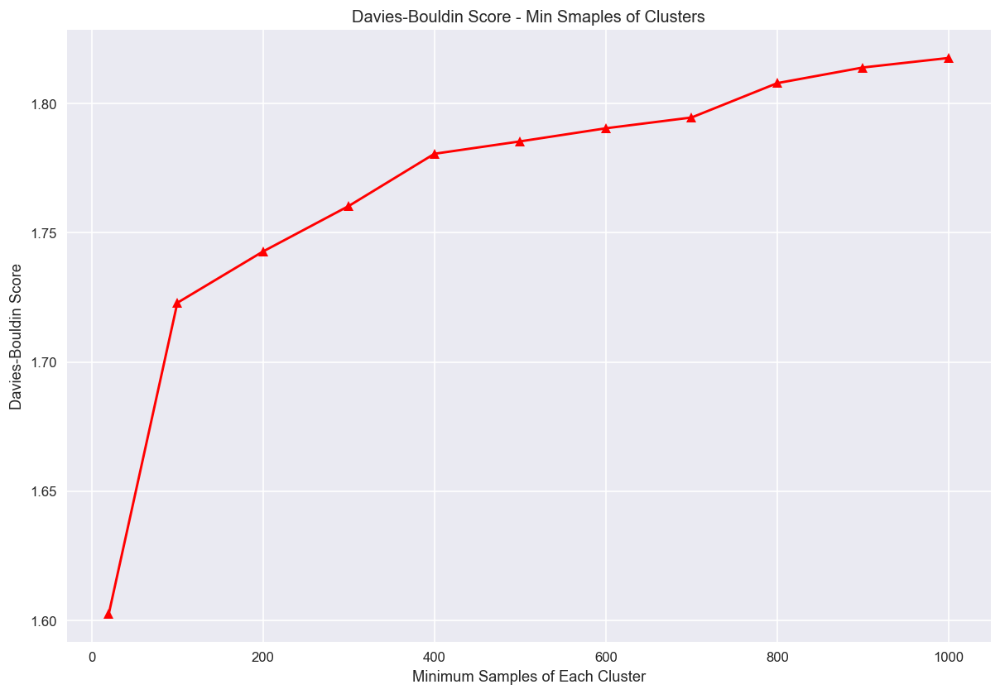

In [123]:
db_scores = []

for min_points in [20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = DBSCAN(eps = epsilon, min_samples = min_points)
    model.fit(X)
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], db_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score - Min Smaples of Clusters')
plt.show()

--- Comparing the plots above, the unusual thing is that *Calinski-Harabasz* score is in contranst with the two other measures. Increasing *min_smaples* results in better *Calinski-Harabsz* score, while it causes *Silhouette* score and *Davies-Bouldin* score the get worse.

--- From all the points above, 200 can be another good choice to see if *DBSCAN* can outperform *KMeans*.

In [124]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = DBSCAN(eps = epsilon, min_samples = 200)
model.fit(X)

DBSCAN(eps=3.9956515629901954, min_samples=200)

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [126]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.6298682958619146
CH Score :  856.7931214505728
DB Score :  1.7427656511348273


--- It is obvious that the model did not improve at all!

--- Aiming to improve the model, some of the outliers are being excluded manually by using *df_1* instead of *data*.

In [127]:
X = scaler.fit_transform(df_1)
neighbors.fit(X)
distances, *other = neighbors.kneighbors(X)
distances = distances[:, 1]
distances = np.sort(distances, axis = 0)
distances

array([9.67493824e-03, 9.67493824e-03, 1.47138497e-02, ...,
       9.36207644e+00, 1.02745113e+01, 1.22724526e+01])

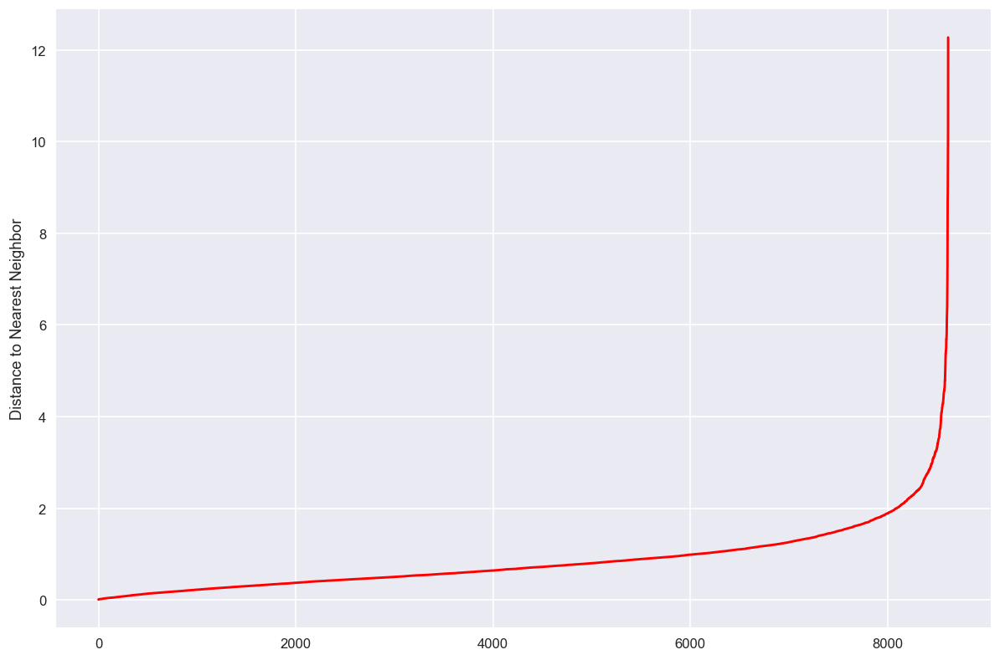

In [128]:
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(distances, color = 'red')
plt.ylabel('Distance to Nearest Neighbor')
plt.show()

In [129]:
kl = KneeLocator(range(len(distances)), distances, curve = 'convex', direction = 'increasing')
epsilon = distances[kl.elbow]
epsilon

5.690516131254522

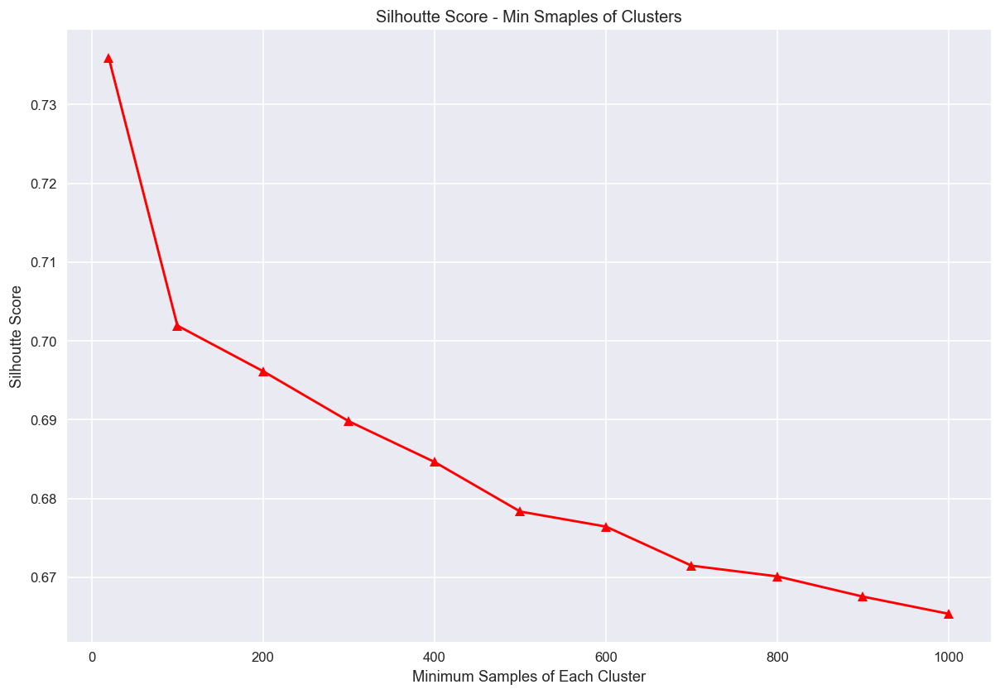

In [130]:
silhoutte_coefs, ch_scores, db_scores = [], [], []

for min_points in [20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    scaler = StandardScaler()
    X = scaler.fit_transform(df_1)
    model = DBSCAN(eps = epsilon, min_samples = min_points)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Min Smaples of Clusters')
plt.show()

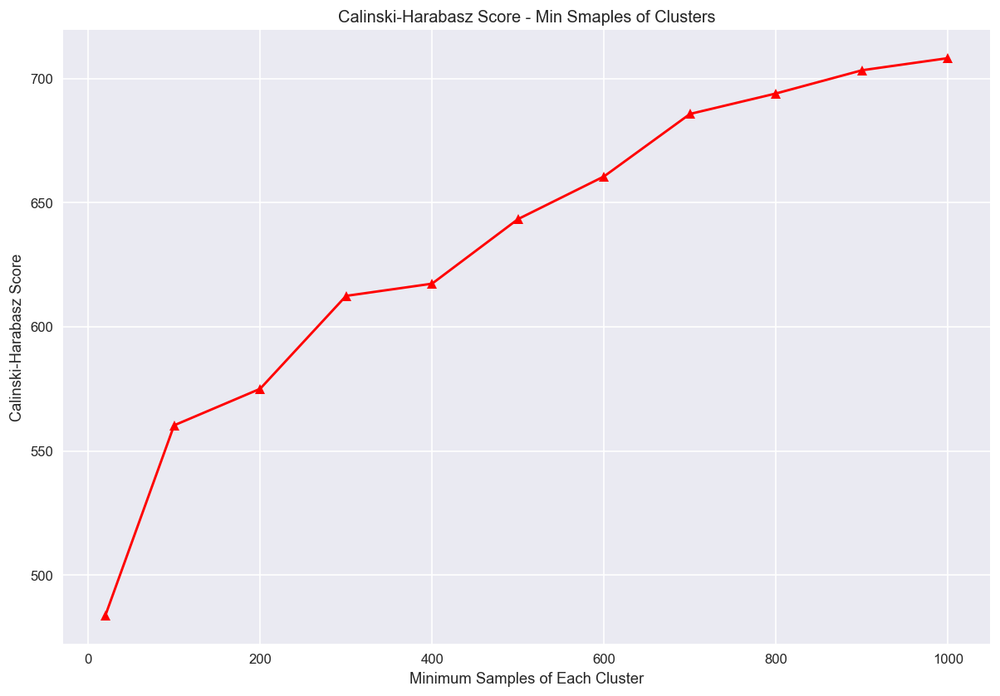

In [131]:
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], ch_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Score - Min Smaples of Clusters')
plt.show()

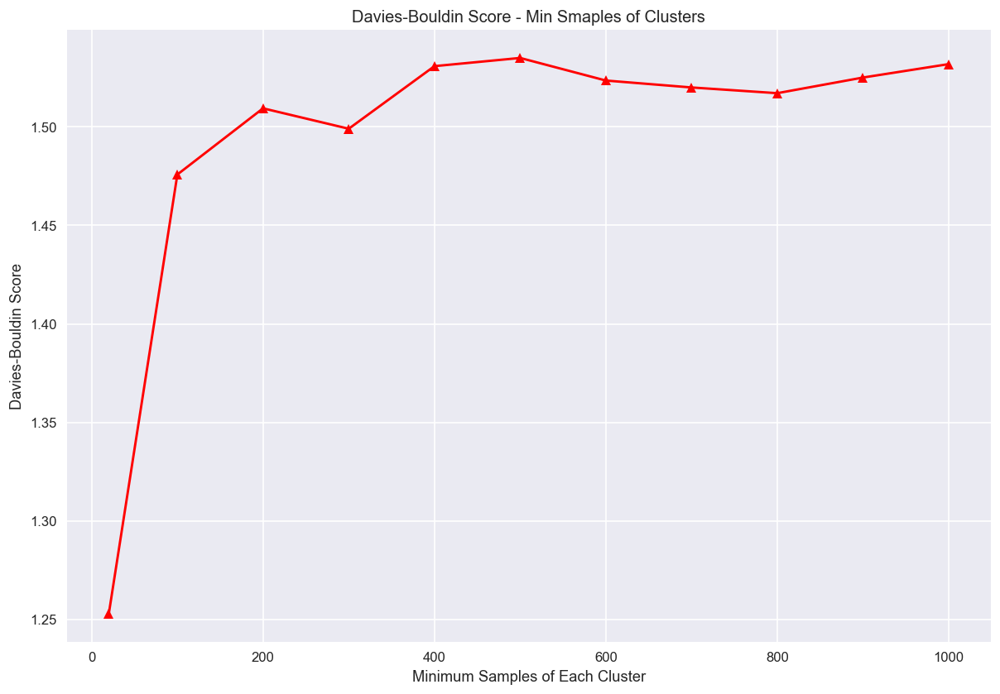

In [132]:
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], db_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score - Min Smaples of Clusters')
plt.show()

In [133]:
scaler = StandardScaler()
X = scaler.fit_transform(df_1)
model = DBSCAN(eps = epsilon, min_samples = 20)
model.fit(X)

DBSCAN(eps=5.690516131254522, min_samples=20)

In [134]:
max(model.labels_)

0

In [135]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.7359068290157958
CH Score :  483.65102411008183
DB Score :  1.252863261088705


--- The results are somehow the same. Although *Silhouette* and *Davies_Bouldin* scores improved, *Calinski-Harabasz* score got worse. Also, the relations between the behavior of metrics are just like the previous iteration. 

--- It should be noted that *DBSCAN* again made just one cluster and counted all other samples as noise!

In [136]:
X = scaler.fit_transform(df_2)
neighbors.fit(X)
distances, *other = neighbors.kneighbors(X)
distances = distances[:, 1]
distances = np.sort(distances, axis = 0)
distances

array([0.00989026, 0.00989026, 0.01488438, ..., 9.04478891, 9.24860243,
       9.70822109])

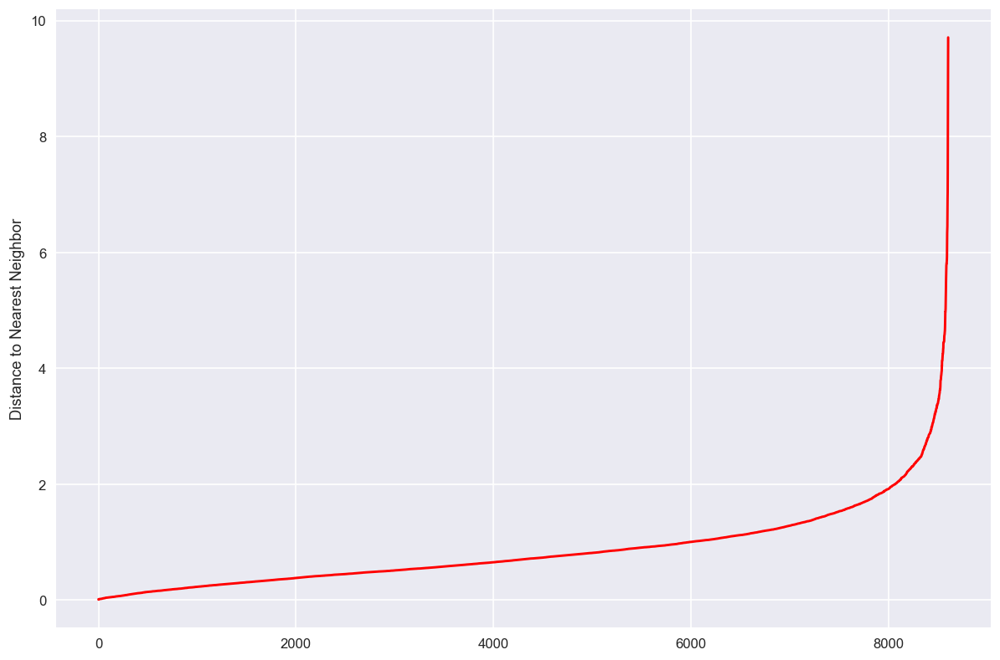

In [137]:
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(distances, color = 'red')
plt.ylabel('Distance to Nearest Neighbor')
plt.show()

In [138]:
kl = KneeLocator(range(len(distances)), distances, curve = 'convex', direction = 'increasing')
epsilon = distances[kl.elbow]
epsilon

4.448821424541804

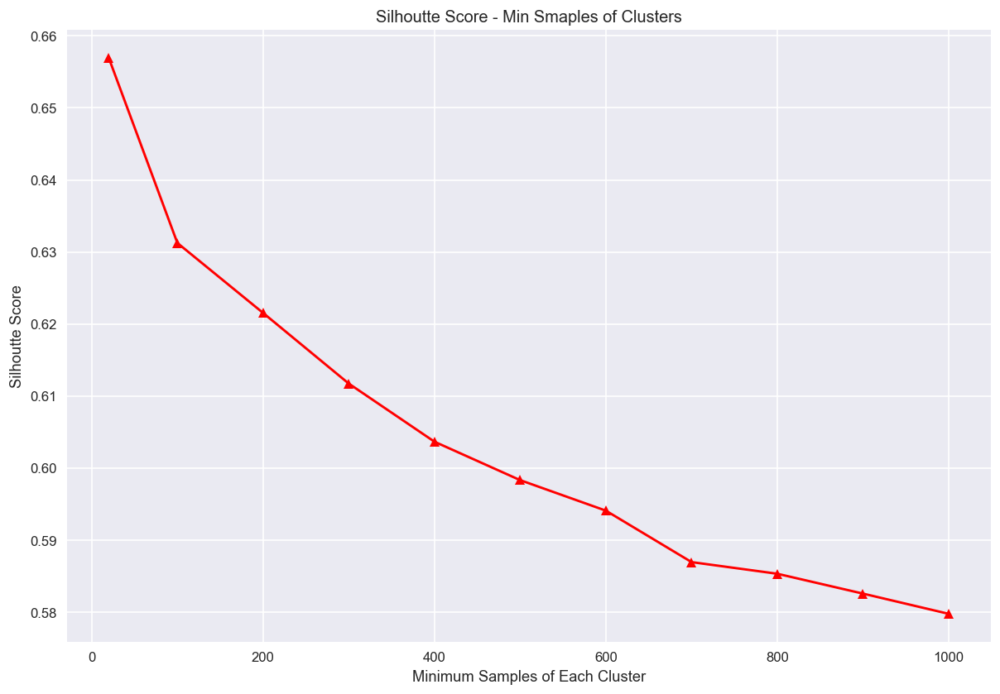

In [139]:
silhoutte_coefs, ch_scores, db_scores = [], [], []

for min_points in [20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]:
    scaler = StandardScaler()
    X = scaler.fit_transform(df_2)
    model = DBSCAN(eps = epsilon, min_samples = min_points)
    model.fit(X)
    silhoutte_coefs.append(metrics.silhouette_score(X, model.labels_))
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Min Smaples of Clusters')
plt.show()

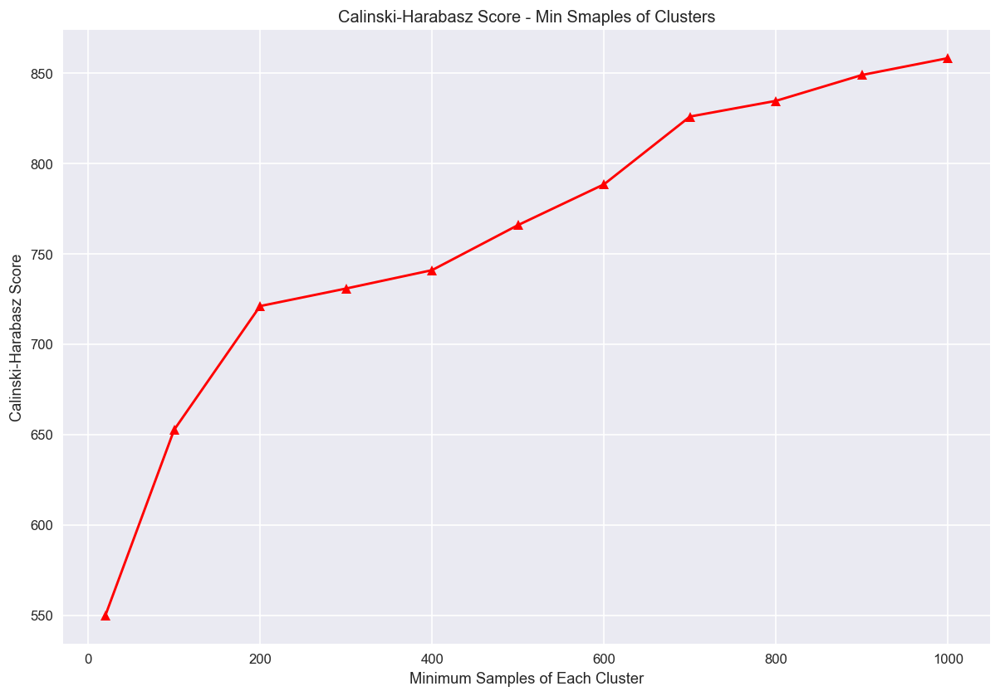

In [140]:
plt.style.use('seaborn')
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], ch_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Calinski-Harabasz Score')
plt.title('Calinski-Harabasz Score - Min Smaples of Clusters')
plt.show()

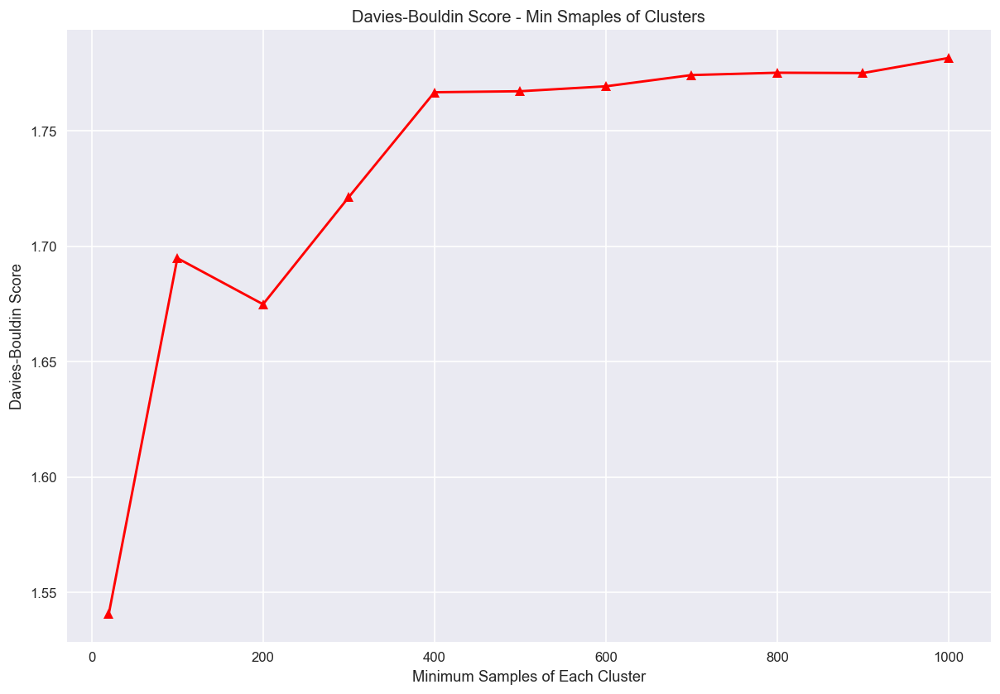

In [141]:
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot([20, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], db_scores, color = 'r', marker = '^')
plt.xlabel('Minimum Samples of Each Cluster')
plt.ylabel('Davies-Bouldin Score')
plt.title('Davies-Bouldin Score - Min Smaples of Clusters')
plt.show()

--- As the difference between 20 and 100 is not much for *Silhouette* score, and as 200 is better than 100 for *Davies-Bouldin* and *Calinski-Harabsz* scores, 200 is our choice for *min_samples*. 

In [142]:
scaler = StandardScaler()
X = scaler.fit_transform(df_2)
model = DBSCAN(eps = epsilon, min_samples = 200)
model.fit(X)

DBSCAN(eps=4.448821424541804, min_samples=200)

In [143]:
max(model.labels_)

0

--- The behavior of the algorithm did not change at all. Again one cluster against some outliers!

--- Considering the results above, it can be conclued that *DBSCAN* is just not an appropriate algorithm for custerig this data.

--- As the *OPTICS* is another variant of *DBSCAN*, *BIRCH* algorithm is being examined.

#### **BIRCH**

--- As the first step of clustering using *BIRCH* method, first an effective range for each hyperparameter is being selected.

--- Considering that *BIRCH* is robust to outliers, and as it is also a data reduction method, whole data is being used.

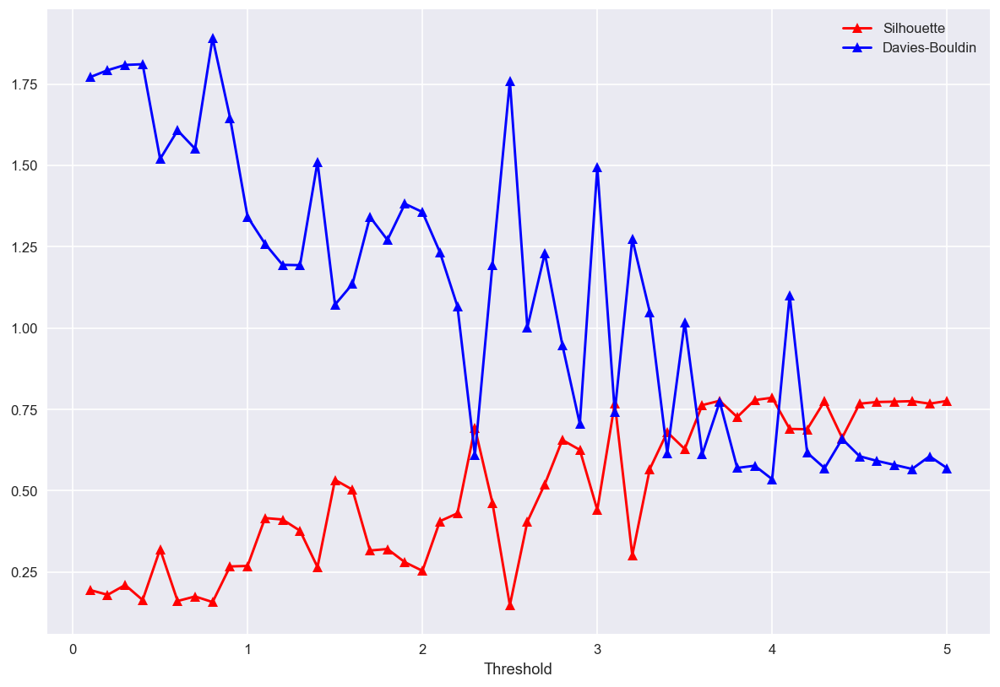

In [144]:
silhouette_scores = []
db_scores = []
for i in np.arange(0.1, 5.1, 0.1):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(threshold = i)
    model.fit(X)
    silhouette_scores.append(metrics.silhouette_score(X, model.labels_))
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(np.arange(0.1, 5.1, 0.1), silhouette_scores, color = 'r', marker = '^', label = 'Silhouette')
plt.plot(np.arange(0.1, 5.1, 0.1), db_scores, color = 'b', marker = '^', label = 'Davies-Bouldin')
plt.xlabel('Threshold')
plt.legend()
plt.show()

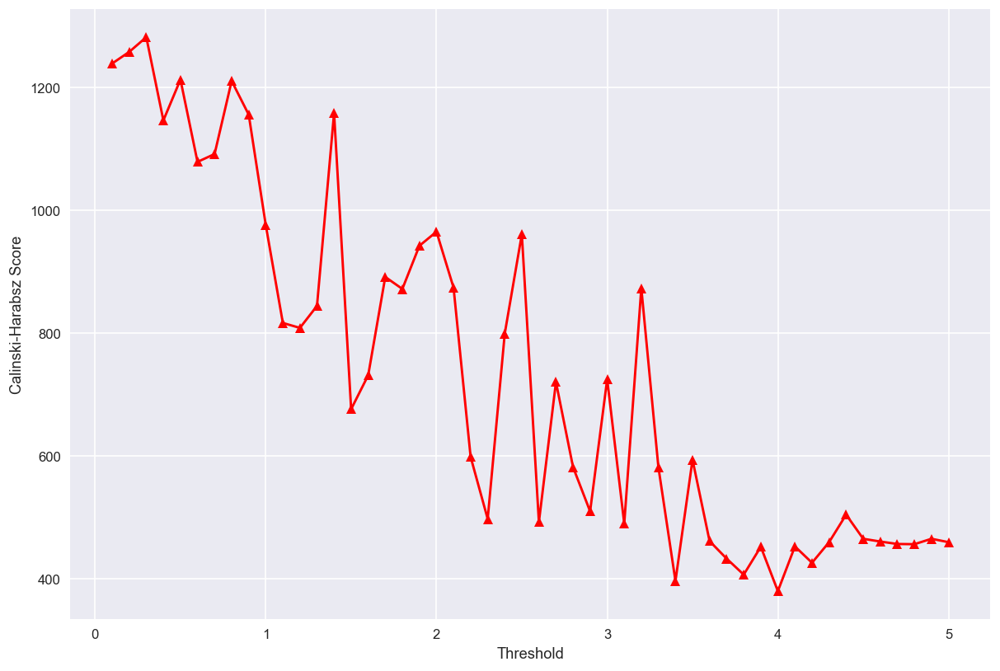

In [145]:
ch_scores = []
for i in np.arange(0.1, 5.1, 0.1):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(threshold = i)
    model.fit(X)
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(np.arange(0.1, 5.1, 0.1), ch_scores, color = 'r', marker = '^')
plt.xlabel('Threshold')
plt.ylabel('Calinski-Harabsz Score')
plt.show()

--- As it can be seen on the charts above, there is high correlation between *Silhouette* score and *Davies-Bouldin*, but *Calinski-Harabsz* score has negative correlation with them! With regards to the role of *threshold* this can be understood. By increasing threshold there will be some clusters with almost no data, and some others with a lot of data. (best value = 0.5)

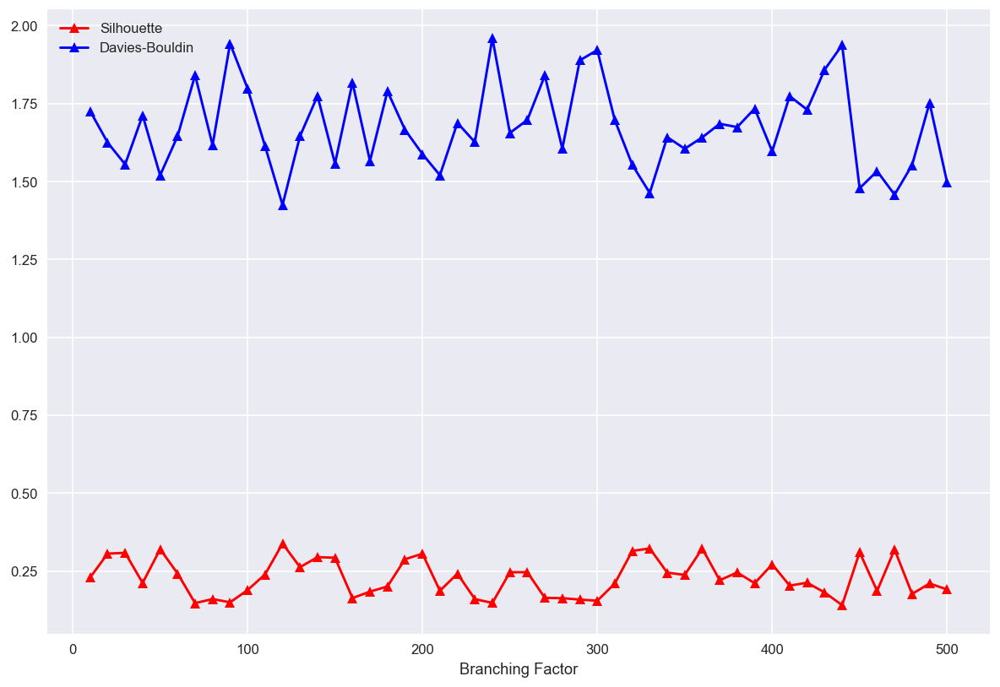

In [146]:
silhouette_scores, db_scores = [], []
for i in range(10, 510, 10):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(branching_factor = i)
    model.fit(X)
    silhouette_scores.append(metrics.silhouette_score(X, model.labels_))
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(np.arange(10, 510, 10), silhouette_scores, color = 'r', marker = '^', label = 'Silhouette')
plt.plot(np.arange(10, 510, 10), db_scores, color = 'b', marker = '^', label = 'Davies-Bouldin')
plt.xlabel('Branching Factor')
plt.legend()
plt.show()

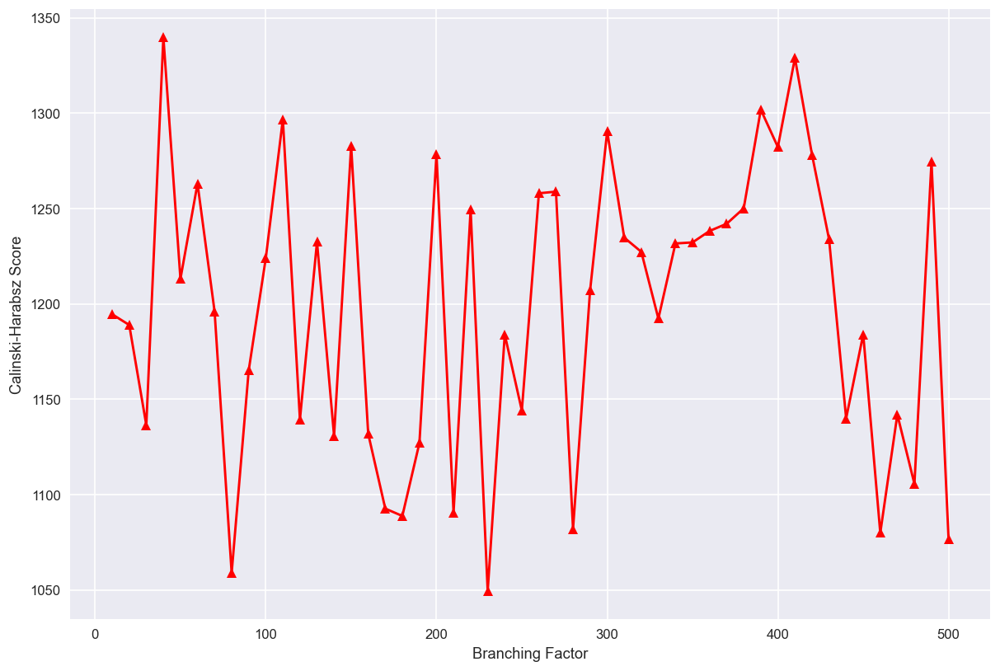

In [147]:
ch_scores = []
for i in range(10, 510, 10):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(branching_factor = i)
    model.fit(X)
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(10, 510, 10), ch_scores, color = 'r', marker = '^')
plt.xlabel('Branching Factor')
plt.ylabel('Calinski-Harabsz Score')
plt.show()

--- It can be seen that by changing *branching_factor*, scores just flactutate around a horizontal line. As a result, whole range is being examined in relation with other hyper parameters.

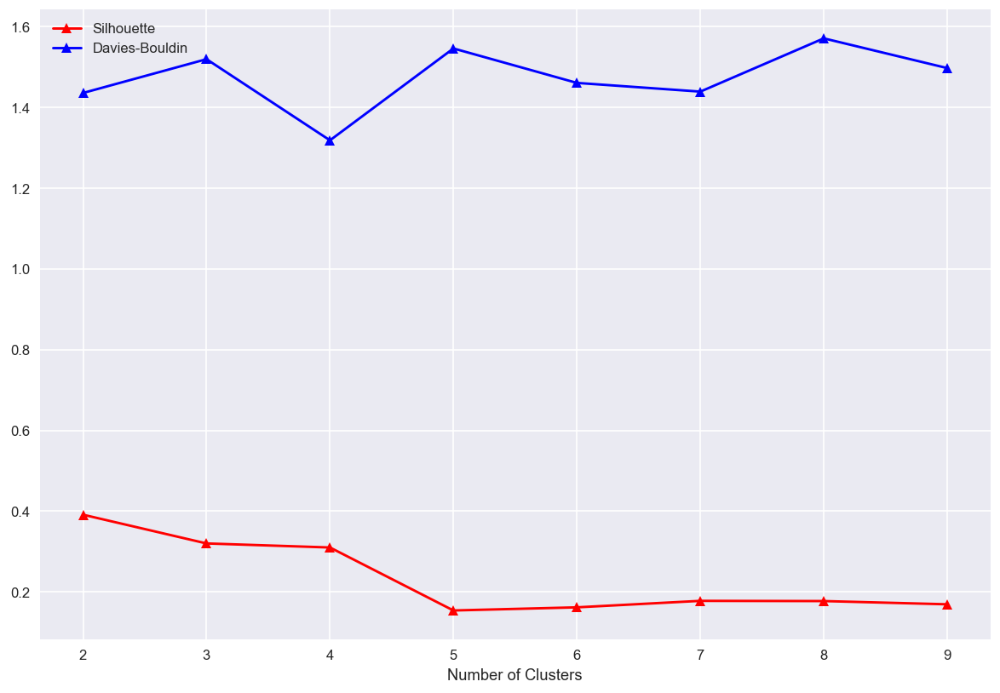

In [148]:
silhouette_scores, db_scores = [], []
for i in range(2, 10):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(n_clusters = i)
    model.fit(X)
    silhouette_scores.append(metrics.silhouette_score(X, model.labels_))
    db_scores.append(metrics.davies_bouldin_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 10), silhouette_scores, color = 'r', marker = '^', label = 'Silhouette')
plt.plot(range(2, 10), db_scores, color = 'b', marker = '^', label = 'Davies-Bouldin')
plt.xlabel('Number of Clusters')
plt.legend()
plt.show()

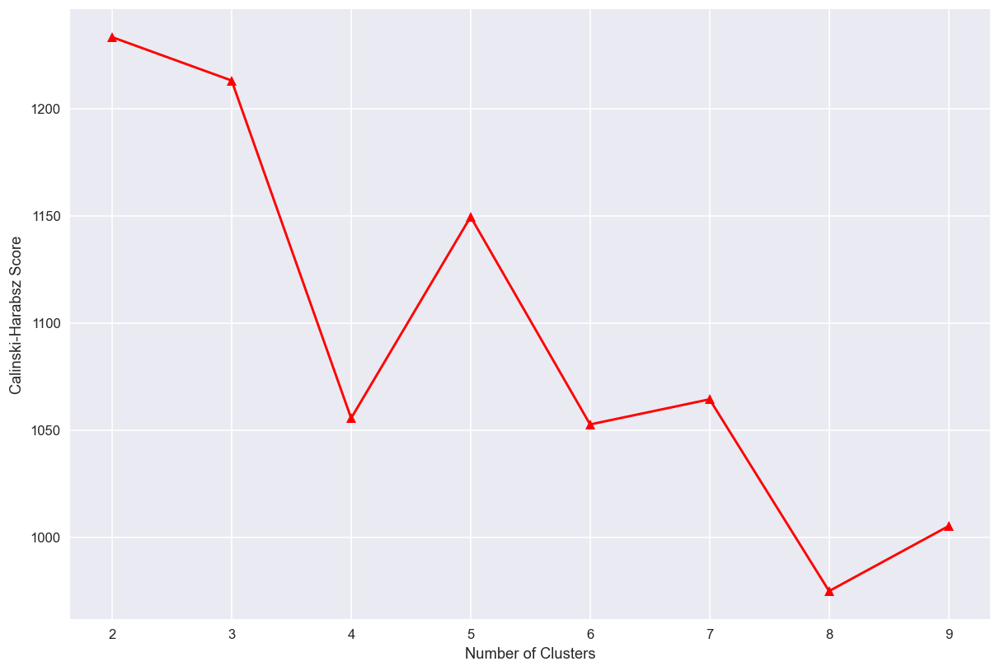

In [149]:
ch_scores = []
for i in range(2, 10):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(n_clusters = i)
    model.fit(X)
    ch_scores.append(metrics.calinski_harabasz_score(X, model.labels_))
    
plt.figure(figsize = (12, 8), dpi = 120)
plt.plot(range(2, 10), ch_scores, color = 'r', marker = '^')
plt.xlabel('Number of Clusters')
plt.ylabel('Calinski-Harabsz Score')
plt.show()

--- With regards to the plot above, when the number of clusters are 4 or less, the model performs much better with regards to *Silhouette* and *Davies-Bouldin* scores. However, *Calinski-Harabsz* score is at the top while the number of clusters is wither2 or 3. [2, 3]

In [150]:
params = {'branching_factor' : range(50, 510, 10), 'n_clusters' : [2, 3]}

In [151]:
silhoutte_scores, ch_scores, db_scores = [], [], []

for parameter in ParameterGrid(params):
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    model = Birch(threshold = 0.5, **parameter)
    model.fit(X)
    silhoutte_score = str(metrics.silhouette_score(X, model.labels_))
    ch_score = str(metrics.calinski_harabasz_score(X, model.labels_))
    db_score = str(metrics.davies_bouldin_score(X, model.labels_))
    branching_factor = str(parameter['branching_factor'])
    n_clusters = str(parameter['n_clusters'])
    silhoutte_scores.append(branching_factor + ' / ' + n_clusters + ' / ' + silhoutte_score)
    ch_scores.append(branching_factor + ' / ' + n_clusters + ' / ' + ch_score)
    db_scores.append(branching_factor + ' / ' + n_clusters + ' / ' + db_score)

In [152]:
a = np.array(sorted(silhoutte_scores, key = lambda x:float(x.split(' / ')[-1]), reverse = True)).reshape(-1, 1)
b = np.array(sorted(ch_scores, key = lambda x:float(x.split(' / ')[-1]), reverse = True)).reshape(-1, 1)
c = np.array(sorted(db_scores, key = lambda x:float(x.split(' / ')[-1]))).reshape(-1, 1)

In [153]:
scores_df = pd.DataFrame(a, columns = ['silhouette'])
scores_df['calinski_harabasz'] = b
scores_df['davies_bouldin'] = c
scores_df.head(20)

,silhouette,calinski_harabasz,davies_bouldin
0,340 / 2 / 0.5594617235445738,270 / 2 / 1387.4534212369342,340 / 2 / 1.1966360209062197
1,440 / 2 / 0.5505359703287572,480 / 2 / 1370.0678172331648,250 / 2 / 1.211516414233847
2,350 / 2 / 0.5329139958155299,210 / 2 / 1357.7192996769961,440 / 2 / 1.2133158507849757
3,250 / 2 / 0.5306612975985492,170 / 2 / 1349.5890718605308,400 / 2 / 1.2535785606283574
4,400 / 2 / 0.5185141833782752,500 / 2 / 1345.1802835538388,350 / 2 / 1.2650406022105827
5,310 / 2 / 0.511407218436971,460 / 2 / 1341.6066498146365,470 / 2 / 1.2682310728356536
6,160 / 2 / 0.5108151702023548,430 / 2 / 1334.7184039940057,120 / 2 / 1.2822911037282254
7,470 / 2 / 0.5067973028193736,410 / 3 / 1328.9501119555396,310 / 2 / 1.2907705268542906
8,190 / 2 / 0.4899955983703529,70 / 2 / 1324.0049637149307,160 / 2 / 1.2973043774594692
9,120 / 2 / 0.4847160119451478,280 / 2 / 1318.9836283897841,190 / 2 / 1.3197208213424723


In [154]:
scores_df.tail(20)

,silhouette,calinski_harabasz,davies_bouldin
72,460 / 3 / 0.18590767664306504,470 / 2 / 1122.6906524738838,70 / 3 / 1.8413021556008442
73,170 / 3 / 0.18369759242803302,240 / 2 / 1119.6678515063063,420 / 2 / 1.8502638191515468
74,430 / 3 / 0.1810823384830591,60 / 2 / 1117.6320899000023,430 / 3 / 1.858815083877455
75,480 / 2 / 0.17962699497320964,480 / 3 / 1105.6927547933665,290 / 3 / 1.88873285749324
76,480 / 3 / 0.17643556475158864,170 / 3 / 1092.741514275463,300 / 3 / 1.9215499836005752
77,270 / 3 / 0.16382761046852035,400 / 2 / 1091.0263600809335,440 / 3 / 1.9376887182056997
78,70 / 2 / 0.1636343150365294,210 / 3 / 1090.7570417411623,90 / 3 / 1.9427946938062444
79,280 / 2 / 0.16348131163937782,180 / 3 / 1088.8879132194452,500 / 2 / 1.9481994431554484
80,160 / 3 / 0.1631204484605673,280 / 3 / 1082.1009189132844,430 / 2 / 1.953257436316917
81,280 / 3 / 0.1627498905084393,460 / 3 / 1080.0312423233665,240 / 3 / 1.9602504644403538


--- Analyzing the *scores_df* and running few trial-and-error models, best results achieved with default values excpet for *n_clusters*, which is better to set to 2 instead of 3.

In [155]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = Birch(threshold = 0.5, branching_factor = 50, n_clusters = 2)
model.fit(X)

Birch(n_clusters=2)

In [156]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.39119316525965714
CH Score :  1233.4146623052936
DB Score :  1.4359765065540595


--- Comparing the metrics with those of *KMeans* applied on *df_2*, both *Silhouette* and *Davies_Bouldin* scores improved significantly. On the other hand, *Calinski-Harabasz* shows a poorer performance for *BIRCH* algorithm. For getting a deeper insight, plots are being examined.

In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.
--- In comparison with *DBSCAN* plots are much better, and the diference between two clusters are more distinguishable. However, they are not as good as the plots of *KMeans* results applied on *df_2*.

--- Reminding that kde plots drawn in data analysis part had some valuable information about the density of the data, and the fact that *Mean Shift* algorithm approach is close to that kernel, next it will be examined.

#### **Mean Shift**

In [158]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = MeanShift(n_jobs = -1)
model.fit(X)

MeanShift(n_jobs=-1)

In [159]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.2724685846534361
CH Score :  66.84466612651755
DB Score :  0.8773092718065754


In [ ]:
plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 400)
        plt.subplot(1,2,1)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(data['BALANCE'], data[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

##### Output has been removed in order to reduce the size of this notebook.

In [161]:
max(model.labels_)

76

--- The algorithm clustered the smaples into 76 different clusters! This model it the worst up to now and it won't be used any further for this dataset!

#### **Affinity Propagation**

In [162]:
scaler = StandardScaler()
X = scaler.fit_transform(data)
model = AffinityPropagation()
model.fit(X)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:148: FutureWarning: 'random_state' has been introduced in 0.23. It will be set to None starting from 1.0 (renaming of 0.25) which means that results will differ at every function call. Set 'random_state' to None to silence this warning, or to 0 to keep the behavior of versions <0.23.
  warnings.warn(


AffinityPropagation()

In [163]:
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Silhouette Score :  0.12277322278679115
CH Score :  228.74389408476188
DB Score :  1.2871654430570738


In [164]:
max(model.labels_)

356

--- Initial run of this algorithm is worse than *Mean Shift* !

--- All in all, as *BIRCH* algorithm is an instance of *Hierarchical* clustering methos, other than *Spectral Clustering*, from all other methods at least one instance has been checked. From all the models above, only *BIRCH* and *KMeans* had an acceptable result, and from my point of view, *KMeans* clusterings on *df_2* are the best between these two. As a result, the following model and clustering is the final model.

#### **Final Model**

In [165]:
scaler = StandardScaler()
X = scaler.fit_transform(df_2)
model = KMeans(n_clusters = 3, **kmeans_constants)
model.fit(X)

KMeans(n_clusters=3, n_init=100, random_state=1)

In [166]:
print('Inertia : ', model.inertia_)
print('Silhouette Score : ', metrics.silhouette_score(X, model.labels_))
print('CH Score : ', metrics.calinski_harabasz_score(X, model.labels_))
print('DB Score : ', metrics.davies_bouldin_score(X, model.labels_))

Inertia :  104720.60579079123
Silhouette Score :  0.2537175822448592
CH Score :  1707.1015669746303
DB Score :  1.5848418124128862


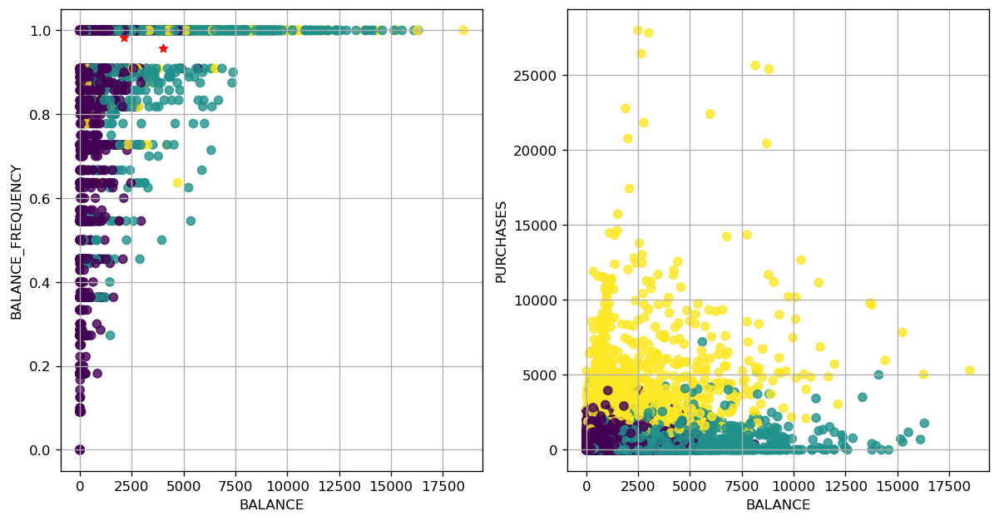

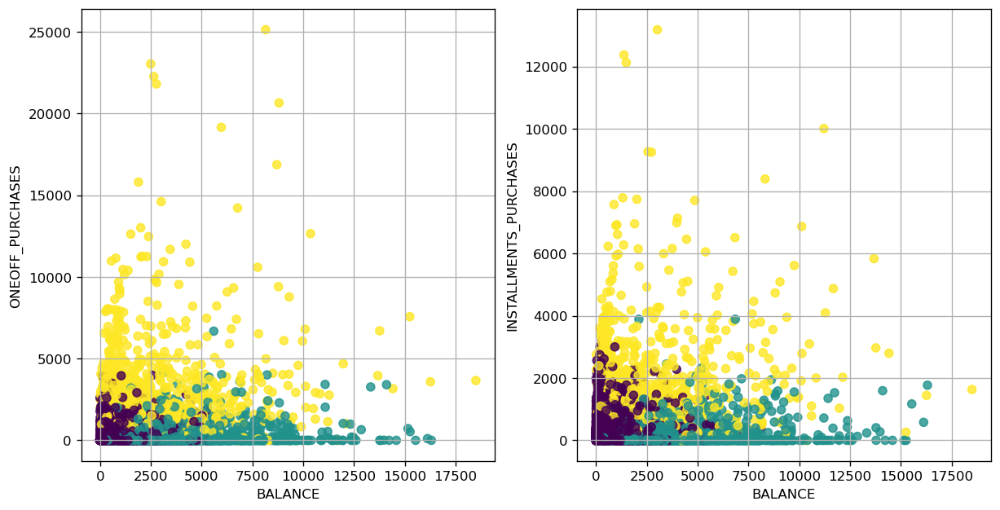

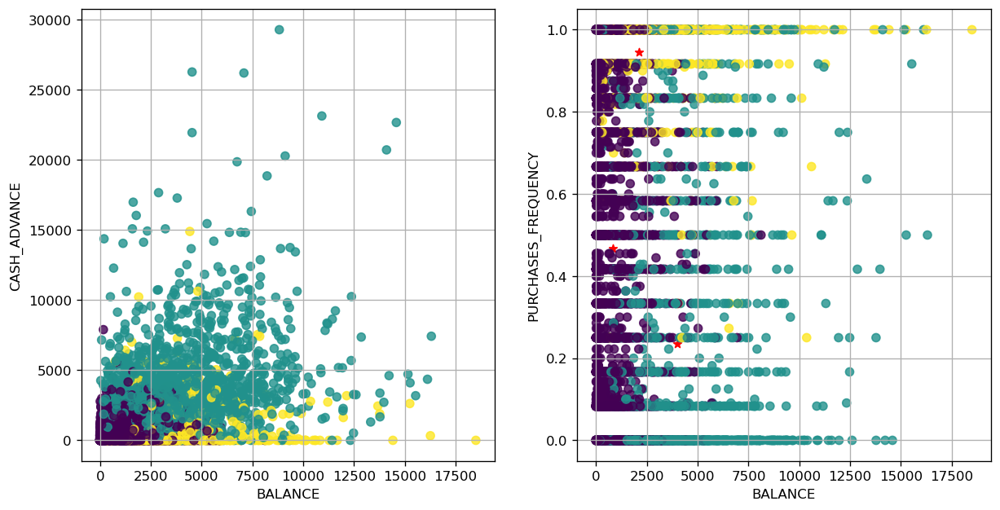

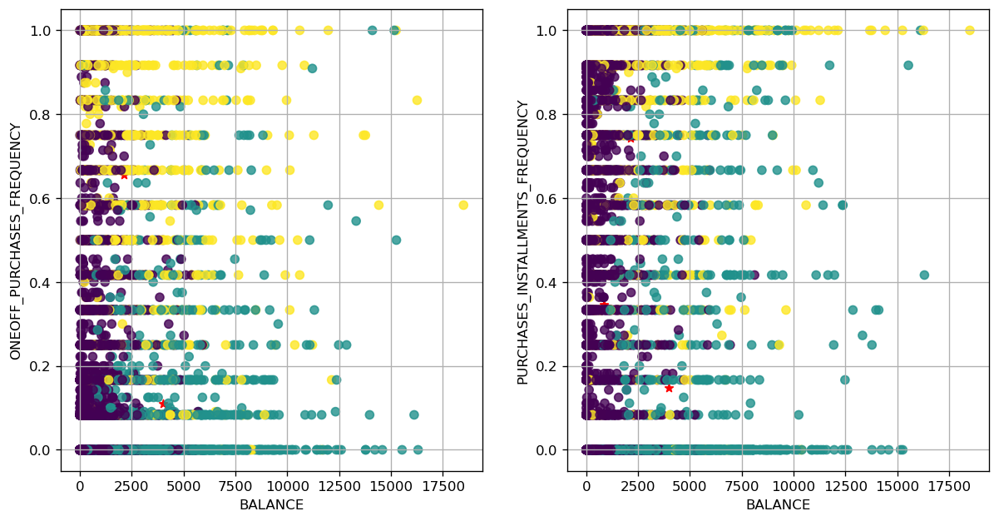

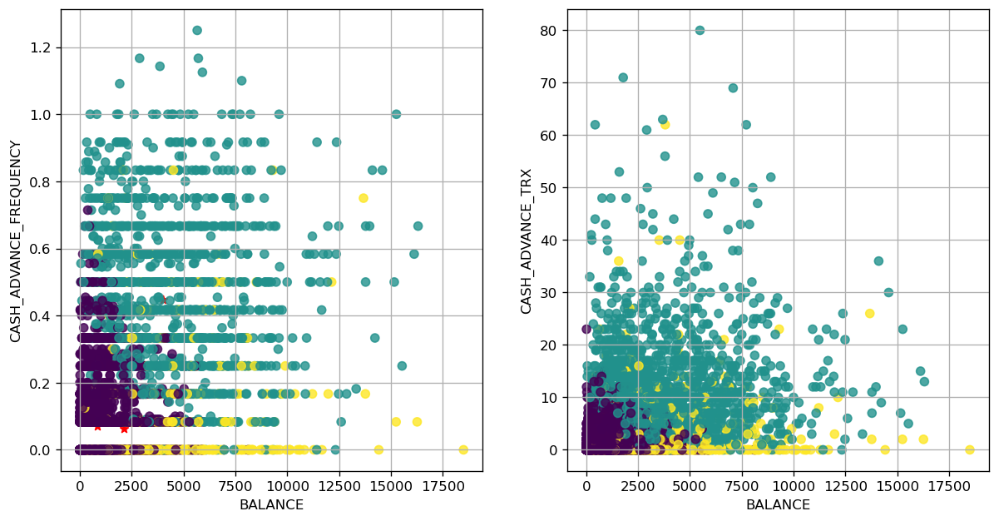

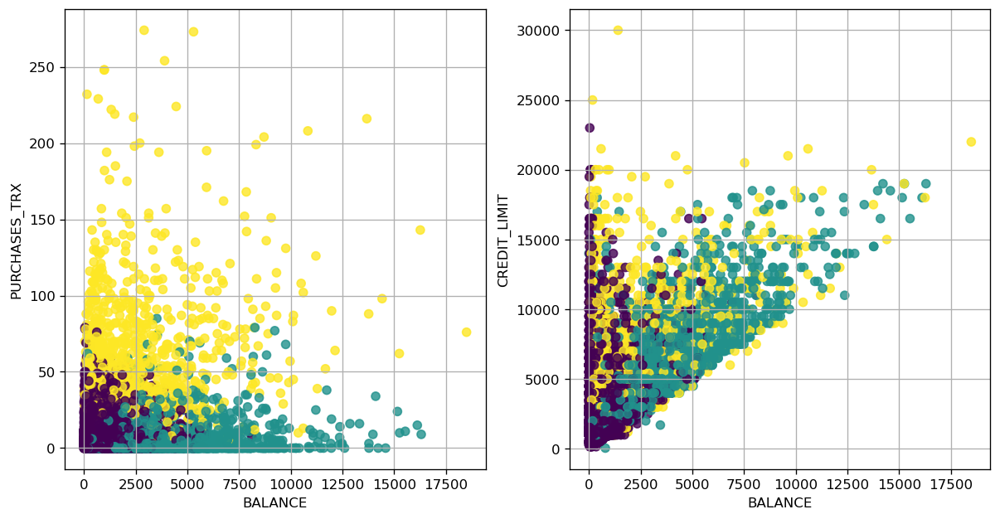

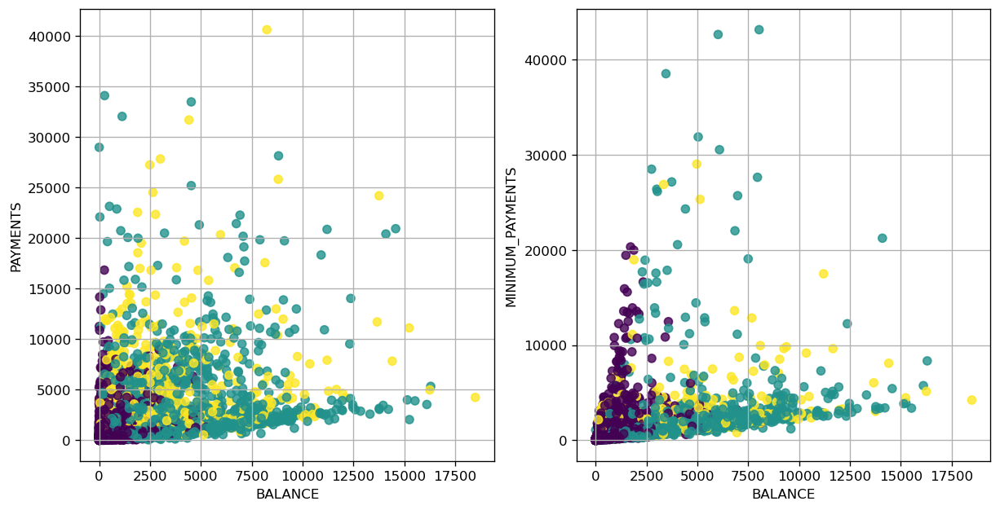

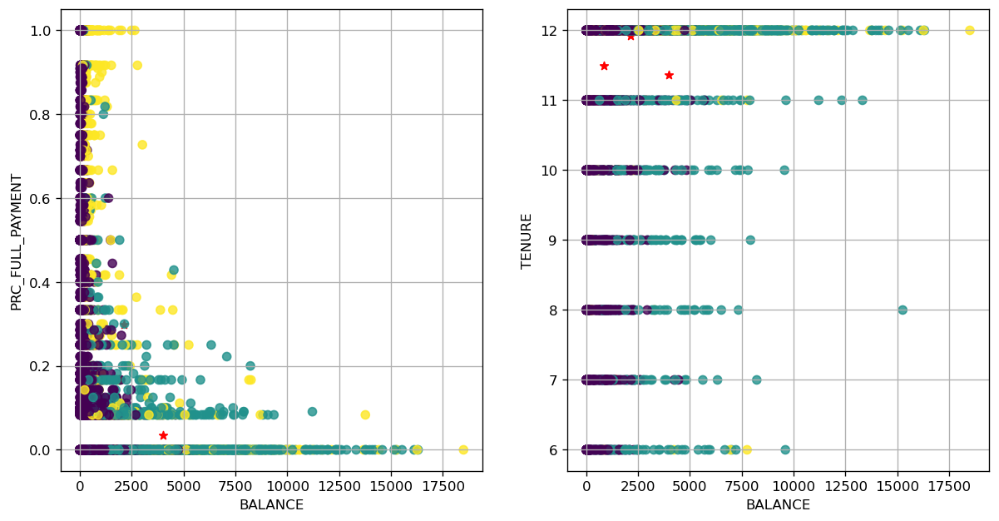

In [167]:
centroids = pd.DataFrame(scaler.inverse_transform(model.cluster_centers_), columns = df_1.columns)

plt.style.use('default')
i = 1
while i < len(data.columns):
    try:
        fig = plt.figure(figsize = (12, 6), dpi = 120)
        plt.subplot(1,2,1)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_2['BALANCE'], df_2[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
        plt.subplot(1,2,2)
        plt.scatter(centroids['BALANCE'], centroids[data.columns[i]], marker = '*', c = 'r')
        plt.scatter(df_2['BALANCE'], df_2[data.columns[i]],
                    c = model.labels_.astype(float), alpha = 0.8)
        plt.xlabel('BALANCE')
        plt.ylabel(data.columns[i])
        plt.grid()
        i += 1
    except IndexError:
        break
plt.show()

--- It should not be forgotten that the clustering of this dataset probably require more skill with different clustering methods, and also pre-processing approaches and methods.